In [51]:
# ==========================================
# 📦 DATA HANDLING & NUMERIEKE BIBLIOTHEKEN
# ==========================================
import numpy as np
import pandas as pd

# ==========================================
# 📊 VISUALISATIE
# ==========================================
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
import matplotlib.cm as cm
import plotly

# Stijl instellen
sns.set_style('darkgrid')

# ==========================================
# ⚙️ PREPROCESSING
# ==========================================
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# ==========================================
# 🤖 CLUSTERING
# ==========================================
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN
import hdbscan  # Installeren met: pip install hdbscan

# Hiërarchisch clusteren
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist

# ==========================================
# 📉 DIMENSIONALITEITSREDUCTIE
# ==========================================
from sklearn.manifold import TSNE
import umap  # Installeren met: pip install umap-learn

# ==========================================
# 🧪 SYNTHETISCHE DATA GENERATIE
# ==========================================
from sklearn.datasets import make_blobs, make_circles, make_gaussian_quantiles, make_moons

# ==========================================
# 📏 EVALUATIE-METRICS
# ==========================================
from sklearn.metrics import (
    davies_bouldin_score,
    silhouette_score,
    silhouette_samples,
    adjusted_rand_score
)

# ==========================================
# 🔁 BOOTSTRAPPING
# ==========================================
from sklearn.utils import resample

# ==========================================
# 📊 STATISTISCHE TESTEN
# ==========================================
from scipy.stats import (
    chi2_contingency,
    kruskal,
    pearsonr,
    multivariate_normal
)

# ==========================================
# 🎯 MODEL TUNING
# ==========================================
from sklearn.mixture import GaussianMixture
import optuna


In [2]:
import warnings
warnings.filterwarnings("ignore", message="KMeans is known to have a memory leak")


Er is gekozen om verschillende variabelen van te voren niet mee te nemen. Dit heeft te maken met dat het einddoel van de VAVO is om de studenten advies te geven of beter te kunnen ondersteunen. Een paar variabelen die waren meegegeven in de dataset zijn variabelen waar de student geen invloed op kan uitoefenen. Daardoor is gekozen deze variabelen niet mee te nemen in de testen. Deze variabelen zijn: Age, gender, past_failures, health_status en support_family. Natuurlijk kan een student verhuizen waardoor commute_minutes wordt aangepast, maar zien wij “verhuizen” niet als passend advies. 

Ook de variabelen die iets zeggen over het resultaat zijn uit dataset gehaald, omdat advies daarop zou neerkomen op “haal gewoon betere cijfers”. Wel zijn deze variabelen gebruikt om te kijken hoe de verschillende clusters zicht verdelen over deze variabelen.


In [3]:
try:
    df = pd.read_csv(r"C:\Users\lucas\OneDrive\Jaar 5\Stat5\college_math.csv")
except:
    df = pd.read_csv(r"C:\Users\mitch\OneDrive\Documenten\Studie-Toegepaste-wiskunde\statistiek\stat5\Eindopdracht\college_math.csv", sep = ',')
df_heel = df
useless_var = ["age", "gender",'commute_minutes','grade_period1','grade_period2','past_failures','health_status','support_family']
df = df.drop(columns=useless_var)

In [4]:
df.isna().sum()

alcohol_weekday       0
alcohol_weekend       0
extra_paid_classes    0
free_time             0
grade_final           0
internet_access       0
school_absences       0
social_outings        0
support_school        0
weekly_study_hours    0
dtype: int64

In [5]:
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df

,alcohol_weekday,alcohol_weekend,extra_paid_classes,free_time,grade_final,internet_access,school_absences,social_outings,support_school,weekly_study_hours
0,0.00,0.00,0.0,1.00,0.888889,0.0,0.0000,0.50,0.0,0.069444
1,0.25,0.25,0.0,0.25,0.000000,0.0,0.0000,0.75,0.0,0.256944
2,0.50,0.50,0.0,0.75,0.333333,1.0,0.1000,0.75,0.0,0.111111
3,0.00,0.00,1.0,0.50,0.666667,1.0,0.0000,0.50,0.0,0.826389
4,0.00,0.00,0.0,0.75,0.611111,1.0,0.2500,0.75,0.0,0.291667
...,...,...,...,...,...,...,...,...,...,...
568,0.50,0.75,1.0,0.25,0.833333,1.0,0.1625,1.00,0.0,0.166667
569,0.00,0.00,0.0,0.25,0.000000,0.0,0.0000,0.00,0.0,0.138889
570,0.00,0.50,0.0,0.50,0.666667,1.0,0.1375,0.50,0.0,0.152778
571,0.00,0.25,0.0,1.00,0.555556,0.0,0.0000,0.50,0.0,0.298611


Kijken wat voor soort variabelen in de dataset zitten zodat kan worden gezien hoe we met de variabelen om zouden kunnen gaan

In [6]:
results = []

for col in df.columns:
    if col == "grade_final":
        continue
    
    # Numerieke kolommen
    if pd.api.types.is_numeric_dtype(df[col]) and df[col].nunique() > 2:
        # Pearson correlatie
        corr, p = pearsonr(df[col], df["grade_final"])
        results.append({
            "Variable": col,
            "Type": "Numeric",
            "Test": "Pearson",
            "Statistic/Correlation": corr,
            "p-value": p
        })
    else:
        # Dummy of categorisch → Kruskal-Wallis
        groups = [df["grade_final"][df[col] == val] for val in df[col].unique()]
        stat, p = kruskal(*groups)
        results.append({
            "Variable": col,
            "Type": "Categorical/Dummy",
            "Test": "Kruskal-Wallis",
            "Statistic/Correlation": stat,
            "p-value": p
        })

# Resultaten in DataFrame
results_df = pd.DataFrame(results)

# Sorteren op p-value (laagste eerst)
results_df = results_df.sort_values("p-value").reset_index(drop=True)

print(results_df)


             Variable               Type            Test  \
0  weekly_study_hours            Numeric         Pearson   
1  extra_paid_classes  Categorical/Dummy  Kruskal-Wallis   
2      social_outings            Numeric         Pearson   
3     school_absences            Numeric         Pearson   
4      support_school  Categorical/Dummy  Kruskal-Wallis   
5     internet_access  Categorical/Dummy  Kruskal-Wallis   
6     alcohol_weekend            Numeric         Pearson   
7           free_time            Numeric         Pearson   
8     alcohol_weekday            Numeric         Pearson   

   Statistic/Correlation       p-value  
0               0.251521  1.021301e-09  
1              21.905299  2.864418e-06  
2              -0.154152  2.121462e-04  
3               0.149695  3.234393e-04  
4               5.127183  2.355392e-02  
5               2.769584  9.607112e-02  
6              -0.033038  4.299177e-01  
7              -0.031126  4.571049e-01  
8              -0.027961  5.04

Ook is gekeken naar welke variabelen statistisch met de doel variabele onafhankelijk zijn. Deze zijn op een later stadion er ook uitgehaald om te kijken of dat betere clusteringen opleverd

In [7]:
df = df.drop(columns = 'grade_final')
df1 = df

Functies

In [8]:
def k_means_elbow(df):
    inertias = []
    K_range = range(1, 7)
    n_runs = 10  # aantal herhalingen per k

    for k in K_range:
        run_inertias = []
        for _ in range(n_runs):
            model = KMeans(n_clusters=k, n_init='auto')
            model.fit(df)
            run_inertias.append(model.inertia_)
        inertias.append(np.mean(run_inertias))  # gemiddelde inertia per k

    # Elbow plot
    plt.plot(K_range, inertias, marker='o')
    plt.xlabel('Aantal clusters (k)')
    plt.ylabel('Gemiddelde inertia (WCSS)')
    plt.title(f'Elbow plot ({n_runs} runs per k, gemiddelde inertia)')
    plt.show()



def hierarchisch(df):
    combinations = [
        ("single", "euclidean"),
        ("single", "cityblock"),
        ("average", "euclidean"),
        ("average", "cityblock"),
        ("centroid", "euclidean"),
        ("ward", "euclidean")  # Ward vereist Euclidean
    ]
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    for ax, (method, metric) in zip(axes, combinations):
        Z = linkage(df, method=method, metric=metric)
        dendrogram(Z, ax=ax, color_threshold=0)  # alles in één kleur
        ax.set_title(f"{method} linkage, {metric} metric")
    
    plt.tight_layout()
    plt.show()


def dendogram(df, method="ward", metric="euclidean", n_clusters=3, show_labels=False):
    """
    Maakt een dendrogram en retourneert de clusterlabels.
    
    Parameters:
    - df: pandas DataFrame of 2D array
    - method: linkage methode ('ward', 'single', 'average', etc.)
    - metric: afstandsmaat ('euclidean', 'cityblock', etc.)
    - n_clusters: aantal clusters om te visualiseren en terug te geven
    - show_labels: of de labels op de x-as getoond moeten worden (default=False)

    Returns:
    - cluster_labels: numpy array met clusterlabels voor elke sample
    """
    # Linkage matrix
    dist_matrix = pdist(df, metric=metric)
    hc = linkage(dist_matrix, method=method)
    
    # Bereken clusterlabels
    cluster_labels = fcluster(hc, t=n_clusters, criterion='maxclust')
    
    # Bepaal color_threshold (hoogte waarop boom wordt afgeknipt)
    merge_heights = np.sort(hc[:, 2])
    if n_clusters > 1:
        color_threshold = merge_heights[-(n_clusters-1)]
    else:
        color_threshold = merge_heights[-1]  # alles in 1 cluster
    
    # Plot dendrogram
    sns.set_style('darkgrid')
    plt.figure(figsize=(12,6))
    dendrogram(
        hc,
        color_threshold=color_threshold,
        labels=df.index if show_labels else None,
        leaf_rotation=90
    )
    plt.title(f"Dendrogram: {method} linkage, {metric} metric, {n_clusters} clusters")
    plt.xlabel("Samples")
    plt.ylabel(f"{metric.capitalize()} distance")
    plt.show()
    
    return cluster_labels


# functie voor uitvoeren stabiliteitsanalyse voor k-means met behulp van bootstrapping
def stability_bootstrap_kmeans(X, n_clusters=4, n_runs=50):
    scaler=MinMaxScaler
    # maak lijst aan voor bijhouden ARI-scores
    scores = []

    # zet X om naar nparray
    X = X.to_numpy()

    for _ in range(n_runs):
        # voer bootstrapping uit
        idx1 = resample(np.arange(len(X)), replace=True)
        idx2 = resample(np.arange(len(X)), replace=True)

        DF1 = X[idx1]
        DF2 = X[idx2]

        # pas scaling toe indien van toepassing
        if scaler is not None:
            DF1 = scaler().fit_transform(DF1)
            DF2 = scaler().fit_transform(DF2)
        
        # voer k-means uit
        labels1 = KMeans(n_clusters=n_clusters, n_init='auto').fit_predict(DF1)
        labels2 = KMeans(n_clusters=n_clusters, n_init='auto').fit_predict(DF2)
        
        # vergelijk clusteringen op overlappende delen
        overlap = np.intersect1d(idx1, idx2)
        if len(overlap) > 0:
            pos1 = [np.where(idx1 == i)[0][0] for i in overlap]
            pos2 = [np.where(idx2 == i)[0][0] for i in overlap]
            
            # bepaal de Adjusted Rand Index
            score = adjusted_rand_score(labels1[pos1], labels2[pos2])
            scores.append(score)

    print(f"The Adjusted Rand Index for stability of k-means is: {np.mean(scores):.3f}")
    return scores

def stability_bootstrap_hc(X, method='ward', metric='euclidean', n_clusters=4, n_runs=50):
    scaler=MinMaxScaler
    scores = []

    # zet X om naar numpy array
    X = X.to_numpy() if hasattr(X, "to_numpy") else np.array(X)

    for _ in range(n_runs):
        # bootstrap samples
        idx1 = resample(np.arange(len(X)), replace=True)
        idx2 = resample(np.arange(len(X)), replace=True)

        DF1 = X[idx1]
        DF2 = X[idx2]

        # scaling
        if scaler is not None:
            DF1 = scaler().fit_transform(DF1)
            DF2 = scaler().fit_transform(DF2)

        # clustering uitvoeren
        if method == "ward":
            Z1 = linkage(DF1, method=method)  # metric = euclidean verplicht
            Z2 = linkage(DF2, method=method)
        else:
            Z1 = linkage(DF1, method=method, metric=metric)
            Z2 = linkage(DF2, method=method, metric=metric)

        labels1 = fcluster(Z1, t=n_clusters, criterion='maxclust')
        labels2 = fcluster(Z2, t=n_clusters, criterion='maxclust')

        # overlap tussen samples vinden
        overlap = np.intersect1d(idx1, idx2)
        if len(overlap) > 0:
            pos1 = [np.where(idx1 == i)[0][0] for i in overlap]
            pos2 = [np.where(idx2 == i)[0][0] for i in overlap]

            # Adjusted Rand Index
            score = adjusted_rand_score(labels1[pos1], labels2[pos2])
            scores.append(score)

    print(f"The Adjusted Rand Index for stability of hierarchical clustering ({method}, {metric}) is: {np.mean(scores):.3f}")
    return scores

def kmeans_feature_robustness(X, n_clusters, noise_level=0.05, n_runs=50):
    scaler=MinMaxScaler
    # maak verzameling van lijsten aan voor bijhouden ARI-scores
    scores = {i: [] for i in range(X.shape[1])}

    # zet X om naar nparray
    X = X.to_numpy()

    # bepaal de standaarddeviaties
    feature_std = X.std(axis=0)

    # voer k-means op de oorspronkelijke dataset uit; pas scaling toe indien van toepassing
    if scaler is not None:
        X_scaled = scaler().fit_transform(X)
        base_labels = KMeans(n_clusters=n_clusters, n_init='auto').fit_predict(X_scaled)
    else:
        base_labels = KMeans(n_clusters=n_clusters, n_init='auto').fit_predict(X)

    for i in range(X.shape[1]):
        for _ in range(n_runs):
            X_perturbed = X.copy()
            noise = np.random.normal(loc=0.0, scale=noise_level*feature_std[i], size=X.shape[0])
            X_perturbed[:, i] += noise

            if scaler is not None:
                X_perturbed = scaler().fit_transform(X_perturbed)

            perturbed_labels = KMeans(n_clusters=n_clusters, n_init='auto').fit_predict(X_perturbed)
            score = adjusted_rand_score(base_labels, perturbed_labels)
            scores[i].append(score)

        #print(f"The Adjusted Rand Index for robustness of feature {i} in k-means clustering is: {np.mean(scores[i]):.3f}")
    return scores


def hc_feature_robustness(X, method='ward', metric='euclidean', n_clusters=2, noise_level=0.05, n_runs=10):

    scaler = MinMaxScaler
    scores = {i: [] for i in range(X.shape[1])}

    X = X.to_numpy() if hasattr(X, "to_numpy") else np.array(X)
    feature_std = X.std(axis=0)

    # originele clustering
    X_scaled = scaler().fit_transform(X) if scaler is not None else X

    if method == 'ward':
        Z = linkage(X_scaled, method=method)  # metric = euclidean verplicht
    else:
        Z = linkage(X_scaled, method=method, metric=metric)

    base_labels = fcluster(Z, t=n_clusters, criterion='maxclust')

    # ruis toevoegen per feature
    for i in range(X.shape[1]):
        for _ in range(n_runs):
            X_perturbed = X.copy()
            noise = np.random.normal(loc=0.0, scale=noise_level*feature_std[i], size=X.shape[0])
            X_perturbed[:, i] += noise

            X_perturbed_scaled = scaler().fit_transform(X_perturbed) if scaler is not None else X_perturbed

            if method == 'ward':
                Z_perturbed = linkage(X_perturbed_scaled, method=method)
            else:
                Z_perturbed = linkage(X_perturbed_scaled, method=method, metric=metric)

            perturbed_labels = fcluster(Z_perturbed, t=n_clusters, criterion='maxclust')
            score = adjusted_rand_score(base_labels, perturbed_labels)
            scores[i].append(score)

        #print(f"Feature {i}: Adjusted Rand Index = {np.mean(scores[i]):.3f}")

    return scores

def t_sne_embedding(df, labels, dim=2):
    """
    Visualiseer data met t-SNE embedding.
    
    Parameters:
    - df: DataFrame of 2D array
    - labels: clusterlabels
    - dim: dimensies van t-SNE (2 voor 2D, 3 voor 3D)
    """
    tsne = TSNE(n_components=dim, random_state=42)
    X_tsne = tsne.fit_transform(df)

    if dim == 2:
        plt.figure(figsize=(8,6))
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='tab10')
        plt.xlabel("t-SNE 1")
        plt.ylabel("t-SNE 2")
        plt.title(f"t-SNE embedding ({len(set(labels))} clusters)")
        plt.colorbar(label="Cluster")
        plt.show()
    elif dim == 3:
        from mpl_toolkits.mplot3d import Axes3D
        fig = plt.figure(figsize=(8,6))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(X_tsne[:,0], X_tsne[:,1], X_tsne[:,2], c=labels, cmap='tab10')
        ax.set_xlabel("t-SNE 1")
        ax.set_ylabel("t-SNE 2")
        ax.set_zlabel("t-SNE 3")
        fig.colorbar(scatter, label="Cluster")
        plt.title(f"t-SNE embedding ({len(set(labels))} clusters)")
        plt.show()

## Kijken naar welke parameters het beste zijn om de clusters te maken

In [9]:
df1

,alcohol_weekday,alcohol_weekend,extra_paid_classes,free_time,internet_access,school_absences,social_outings,support_school,weekly_study_hours
0,0.00,0.00,0.0,1.00,0.0,0.0000,0.50,0.0,0.069444
1,0.25,0.25,0.0,0.25,0.0,0.0000,0.75,0.0,0.256944
2,0.50,0.50,0.0,0.75,1.0,0.1000,0.75,0.0,0.111111
3,0.00,0.00,1.0,0.50,1.0,0.0000,0.50,0.0,0.826389
4,0.00,0.00,0.0,0.75,1.0,0.2500,0.75,0.0,0.291667
...,...,...,...,...,...,...,...,...,...
568,0.50,0.75,1.0,0.25,1.0,0.1625,1.00,0.0,0.166667
569,0.00,0.00,0.0,0.25,0.0,0.0000,0.00,0.0,0.138889
570,0.00,0.50,0.0,0.50,1.0,0.1375,0.50,0.0,0.152778
571,0.00,0.25,0.0,1.00,0.0,0.0000,0.50,0.0,0.298611


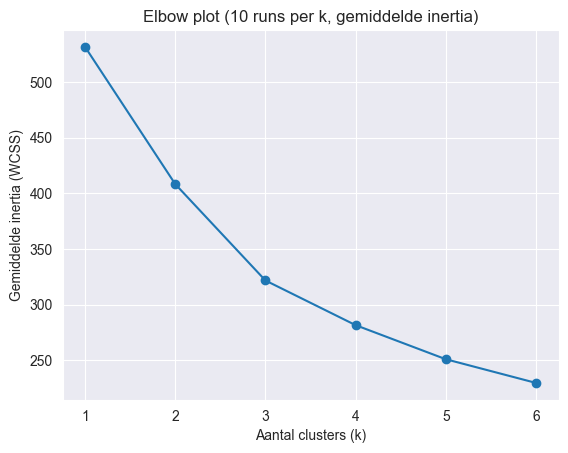

In [10]:
k_means_elbow(df1)

Uit de elbowplot lijkt te komen dat 3 clusters een acceptabel resultaat zou moeten geven, aangezien een hoger waarde van k de WCSS weinig verlaagd.

In [11]:
kmeans = KMeans(n_clusters=3, n_init='auto')
kmeans.fit(df1)
labels_kmeans_1 = kmeans.labels_

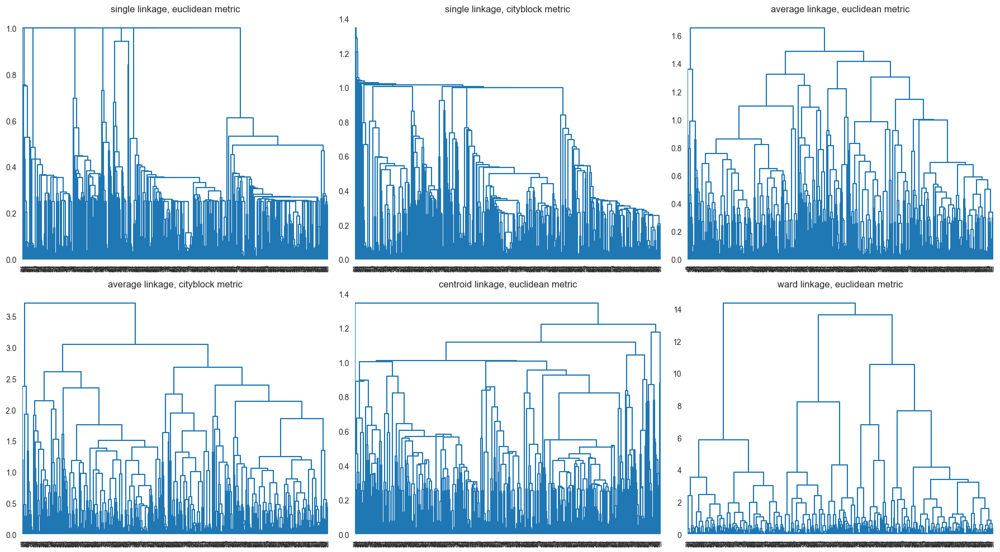

In [12]:
hierarchisch(df1)

Met de Ward linkage worden de clusters het beste gescheiden, daarvoor wordt dus gekozen om mee door te gaan

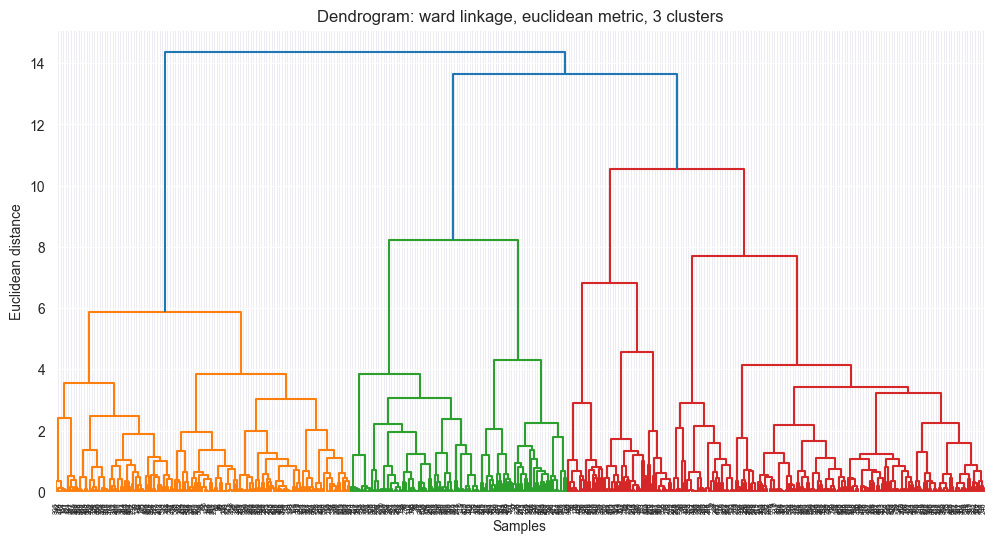

In [13]:
labels_hc_1 = dendogram(df1, method = "ward", metric = "euclidean", n_clusters = 3)

Hier worden de clusteringen gemaakt met alleen nog de variabelen waarvan de correlatie het hoogst is en uit toetsen kwam dat de doelvariabele er statistisch afhankelijk van is

In [14]:
del_var = ['free_time','alcohol_weekday','alcohol_weekend','internet_access']
df2 = df1.drop(columns = del_var)

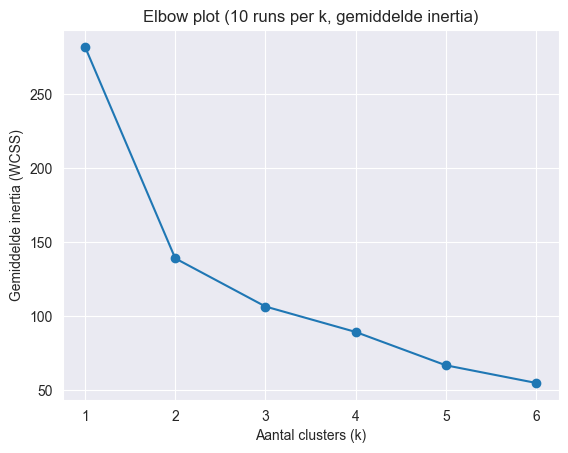

In [15]:
k_means_elbow(df2)

Ook uit deze elbowplot lijkt 3 clusters het beste te zijn

In [16]:
kmeans = KMeans(n_clusters=3, n_init='auto')
kmeans.fit(df2)
labels_kmeans_2 = kmeans.labels_

Hier worden de clusteringen gemaakt met alleen nog de variabelen waarvan de correlatie het hoogst is en uit toetsen kwam dat de doelvariabele er statistisch afhankelijk van is

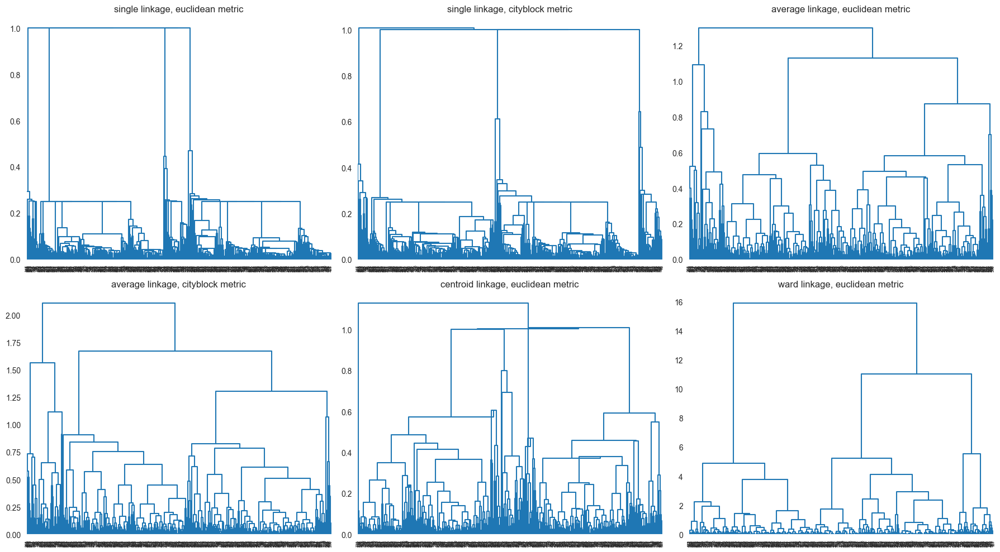

In [18]:
hierarchisch(df2)

Uit de zes mogelijke hiërarchische clusters worden er 3 gekozen, omdat deze de clusters goed lijken te scheiden

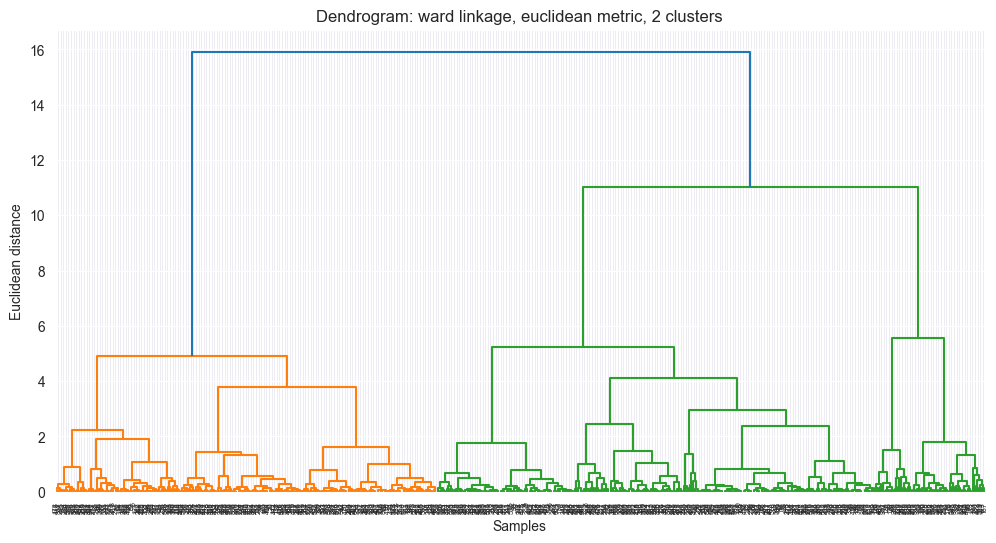

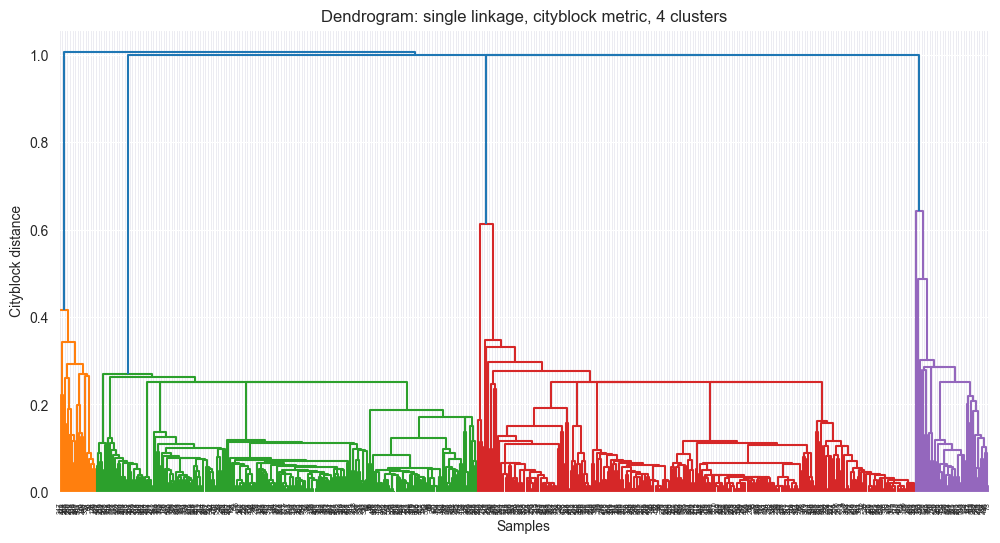

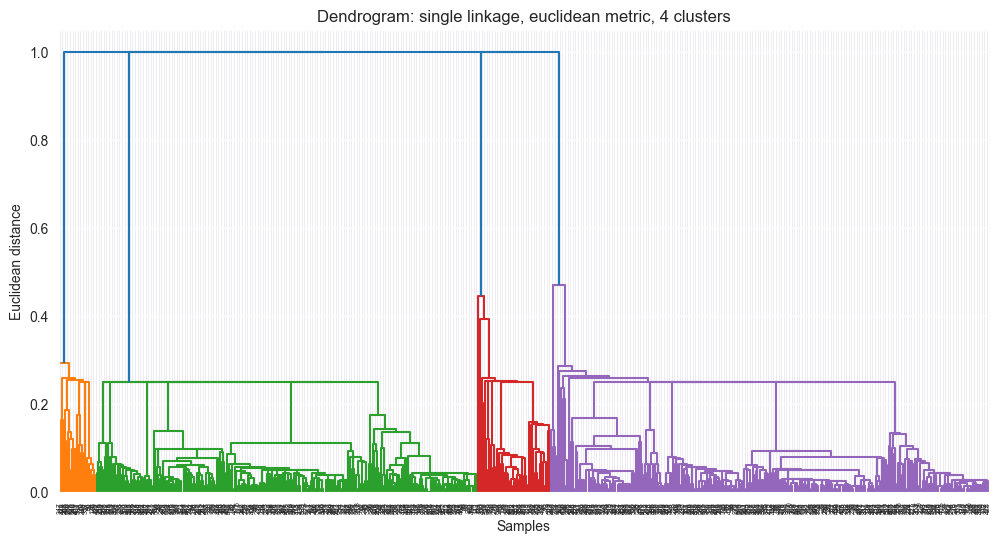

In [19]:
labels_hc_2 = dendogram(df2, method = "ward", metric = "euclidean", n_clusters = 2)
labels_hc_3 = dendogram(df2, method = "single", metric = "cityblock", n_clusters = 4)
labels_hc_4 = dendogram(df2, method = "single", metric = "euclidean", n_clusters = 4)

# Kijken hoe robuust en stabiel de modellen zijn

In [20]:
model_km1 = (df1, 3)
model_km2 = (df2, 3)
model_hc1 = (df1, 3, 'ward', 'euclidean')
model_hc2 = (df2, 2, 'ward', 'euclidean')
model_hc3 = (df2, 4, 'single', 'cityblock')
model_hc4 = (df2, 4, 'single', 'euclidean')

In [21]:
results = []

# KMeans
scores = stability_bootstrap_kmeans(df1, 3)
results.append({'Model': 'KMeans_df1_k=3', 'Mean_ARI': round(np.mean(scores), 2)})

scores = stability_bootstrap_kmeans(df2, 3)
results.append({'Model': 'KMeans_df2_k=3', 'Mean_ARI': round(np.mean(scores), 2)})

# Hiërarchisch clusteren
scores = stability_bootstrap_hc(df1, 'ward', 'euclidean', 3)
results.append({'Model': 'HC_df1_ward_euclidean_k=3', 'Mean_ARI': round(np.mean(scores), 2)})

scores = stability_bootstrap_hc(df2, 'ward', 'euclidean', 2)
results.append({'Model': 'HC_df2_ward_euclidean_k=2', 'Mean_ARI': round(np.mean(scores), 2)})

scores = stability_bootstrap_hc(df2, 'single', 'cityblock', 4)
results.append({'Model': 'HC_df2_single_euclidean_k=4', 'Mean_ARI': round(np.mean(scores), 2)})

scores = stability_bootstrap_hc(df2, 'single', 'euclidean', 4)
results.append({'Model': 'HC_df2_single_cityblock_k=4', 'Mean_ARI': round(np.mean(scores), 2)})

results_df = pd.DataFrame(results)
print(results_df)

The Adjusted Rand Index for stability of k-means is: 0.666
The Adjusted Rand Index for stability of k-means is: 0.791
The Adjusted Rand Index for stability of hierarchical clustering (ward, euclidean) is: 0.905
The Adjusted Rand Index for stability of hierarchical clustering (ward, euclidean) is: 0.984
The Adjusted Rand Index for stability of hierarchical clustering (single, cityblock) is: 1.000
The Adjusted Rand Index for stability of hierarchical clustering (single, euclidean) is: 1.000
                         Model  Mean_ARI
0               KMeans_df1_k=3      0.67
1               KMeans_df2_k=3      0.79
2    HC_df1_ward_euclidean_k=3      0.90
3    HC_df2_ward_euclidean_k=2      0.98
4  HC_df2_single_euclidean_k=4      1.00
5  HC_df2_single_cityblock_k=4      1.00


In [22]:
# voer robuustheidsanalyse k-means uit
ari_kmeans_1 = kmeans_feature_robustness(df1, n_clusters=3, noise_level=0.05, n_runs=10)
ari_kmeans_2 = kmeans_feature_robustness(df2, n_clusters=3, noise_level=0.05, n_runs=10)
ari_hc1 = hc_feature_robustness(df1,'ward','euclidean',3,noise_level=0.05, n_runs = 10)
ari_hc2 = hc_feature_robustness(df2,'ward','euclidean',2,noise_level=0.05, n_runs = 10)
ari_hc3 = hc_feature_robustness(df2,'single','cityblock',4,noise_level=0.05, n_runs = 10)
ari_hc4 = hc_feature_robustness(df2,'single','euclidean',4,noise_level=0.05, n_runs = 10)


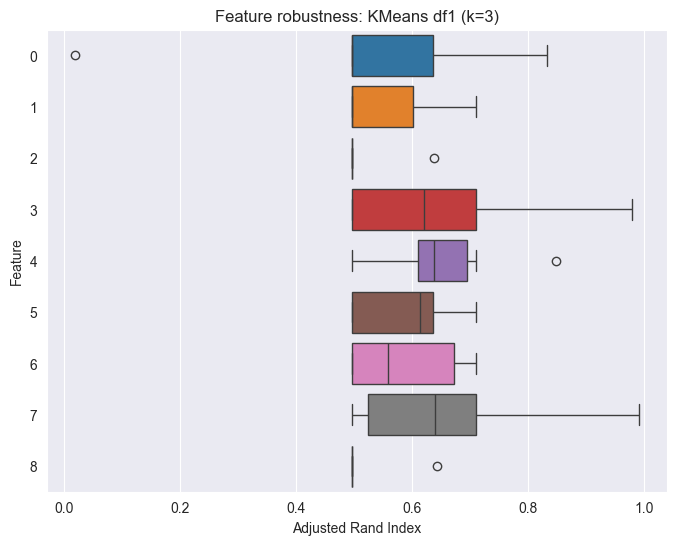

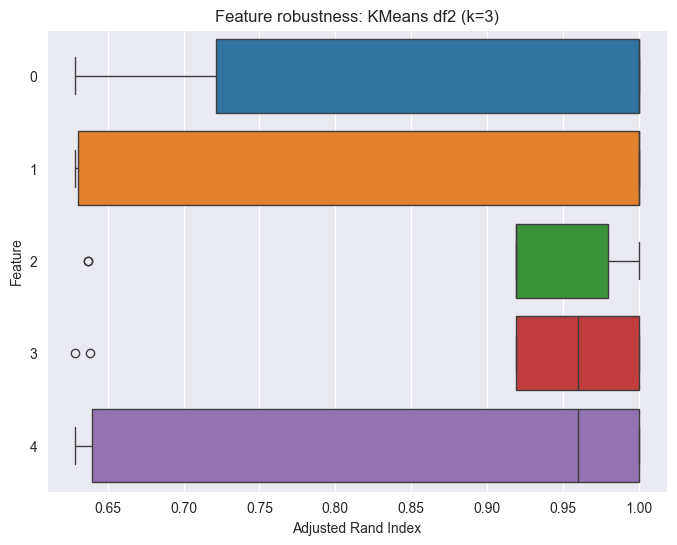

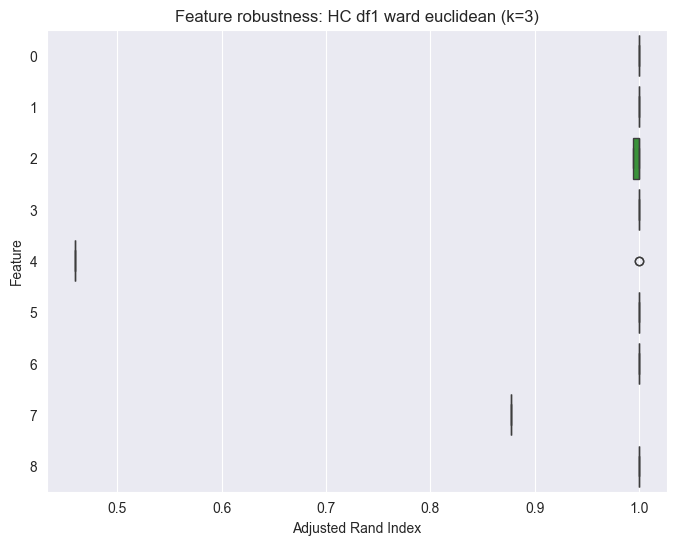

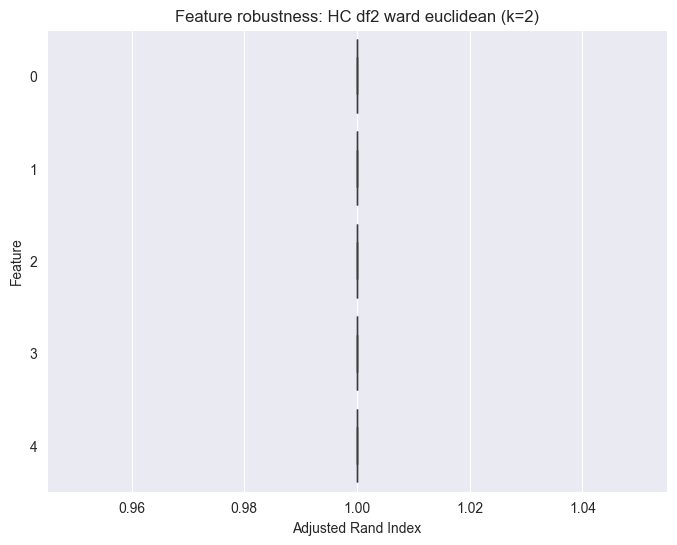

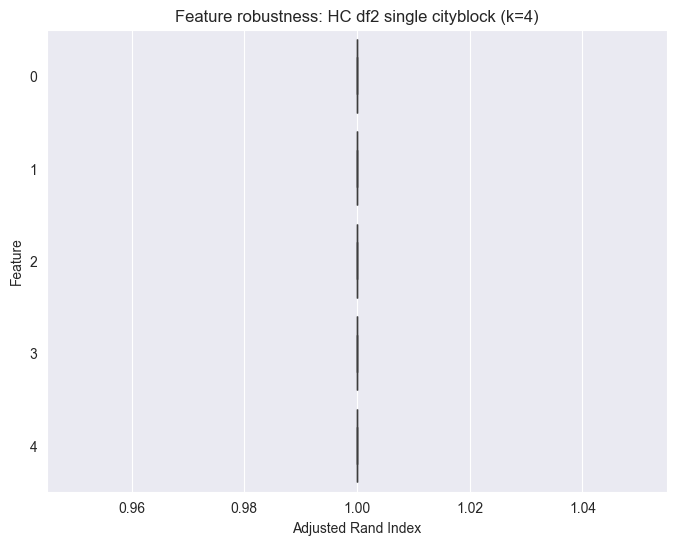

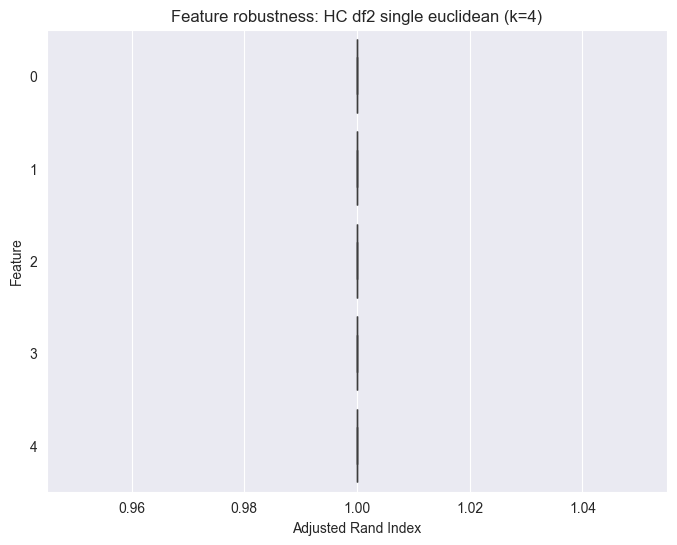

In [23]:
models = [
    (ari_kmeans_1, "KMeans df1 (k=3)"),
    (ari_kmeans_2, "KMeans df2 (k=3)"),
    (ari_hc1, "HC df1 ward euclidean (k=3)"),
    (ari_hc2, "HC df2 ward euclidean (k=2)"),
    (ari_hc3, "HC df2 single cityblock (k=4)"),
    (ari_hc4, "HC df2 single euclidean (k=4)")
]

# 6 plots maken
for ari_dict, title in models:
    # omzetten naar DataFrame
    ari_df = pd.DataFrame(ari_dict)
    
    # boxplot
    plt.figure(figsize=(8,6))
    sns.boxplot(data=ari_df, orient='h')
    plt.xlabel("Adjusted Rand Index")
    plt.ylabel("Feature")
    plt.title(f"Feature robustness: {title}")
    plt.show()

Uit deze scores en plots lijken alle modellen van Hiërarchisch clusteren het het beste te doen.

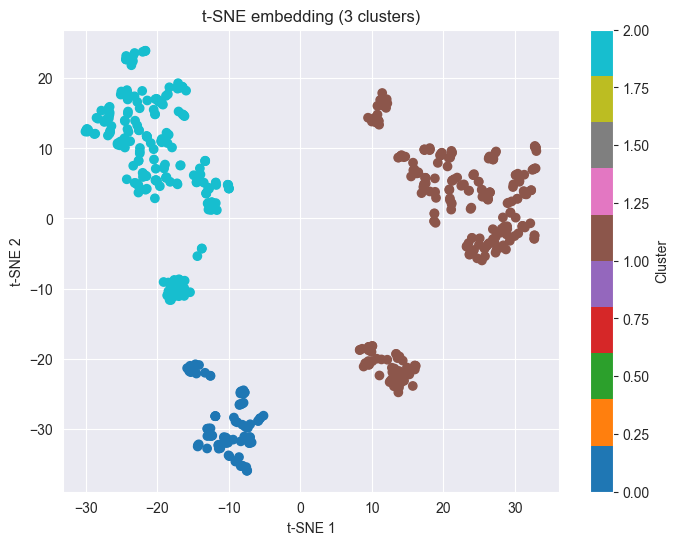

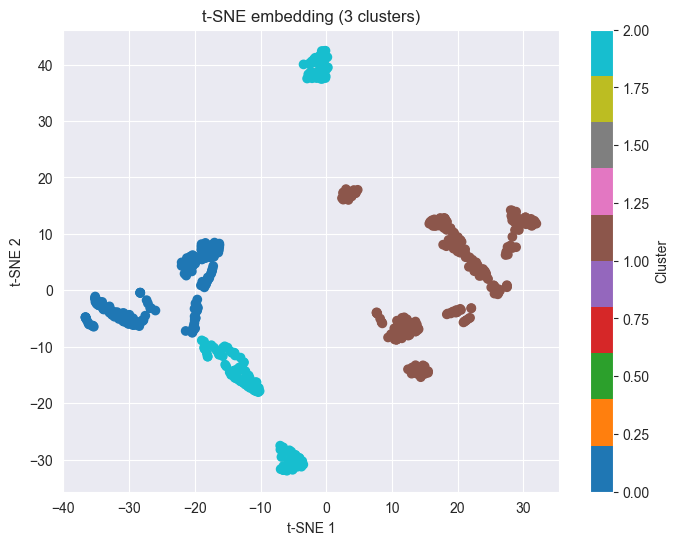

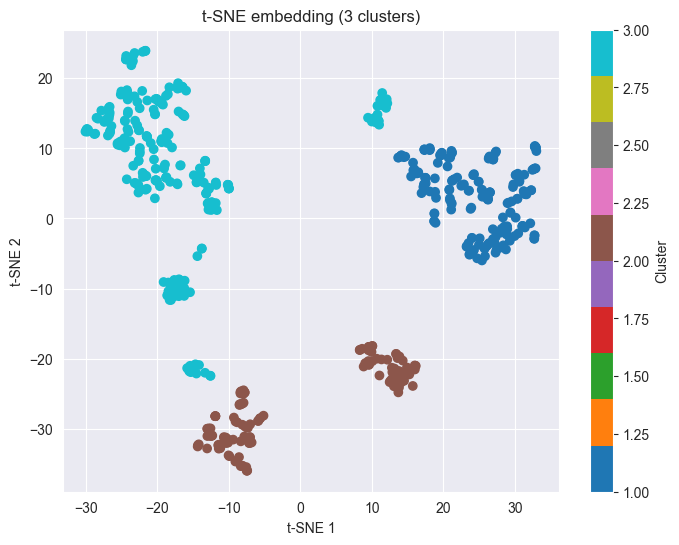

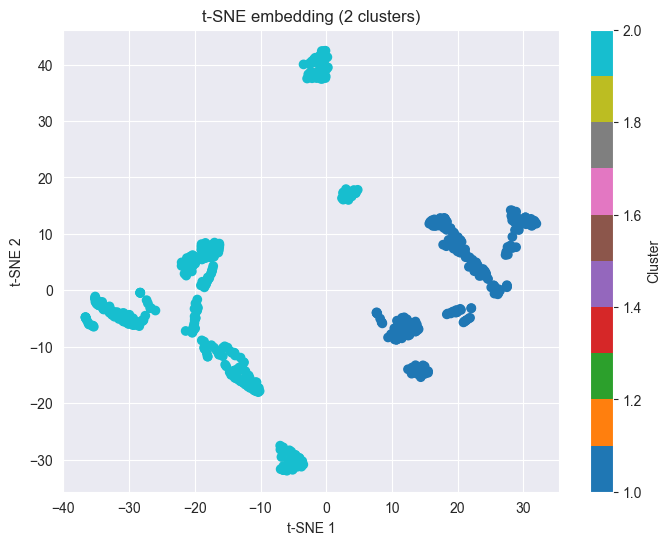

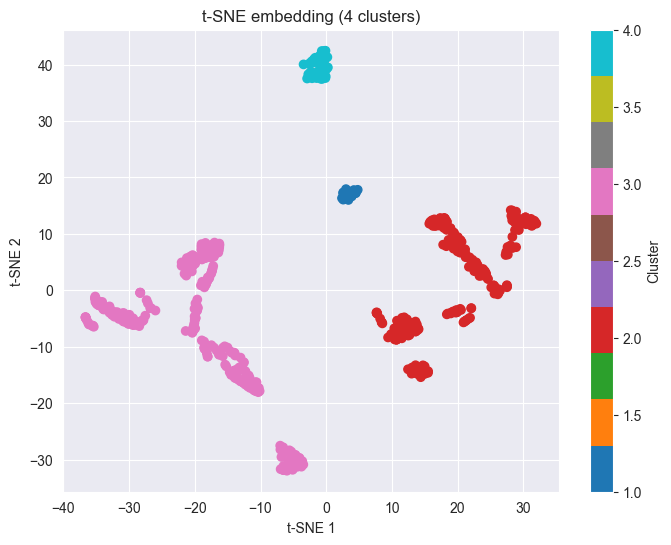

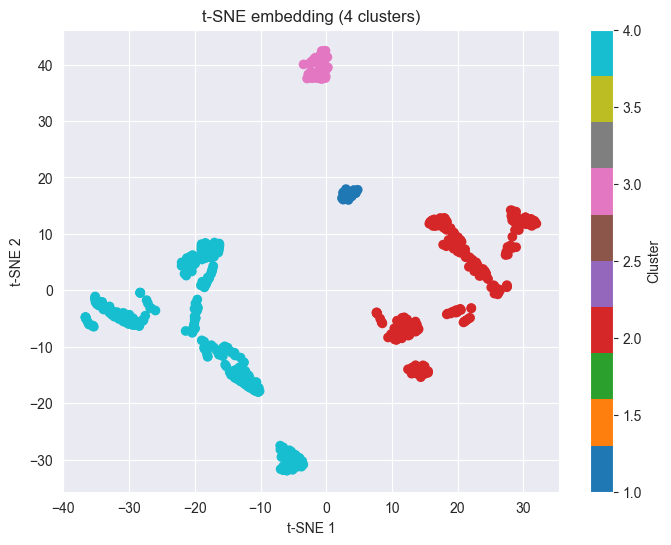

In [24]:
t_sne_embedding(df1, labels_kmeans_1)
t_sne_embedding(df2, labels_kmeans_2)
t_sne_embedding(df1, labels_hc_1)
t_sne_embedding(df2, labels_hc_2)
t_sne_embedding(df2, labels_hc_3)
t_sne_embedding(df2, labels_hc_4)

De bovenstaande visualiaties, die laten zien in hoeverre de modellen de clusters van elkaar scheidt, laat al zien dat niet elk van de gekozen modellen dat even goed doet. Met name het eerste model heeft hier moeite mee. In de andere modellen zijn de clusters wel enigzins van elkaar gescheiden.

Er wordt een jitter toegevoegd zodat de punten niet op elkaar liggen en beter te zien is in de scatterplot hoe de punten zijn ingedeeld in clusters. Deze jitter heeft uiteraard geen invloed gehad op het model.

In [25]:
df1_jitter = df1.copy()
df2_jitter = df2.copy()

jitter_ord = 0.2   # kleine jitter voor ordinale variabelen
jitter_bin = 0.05  # nog kleinere jitter voor binaire variabelen

ord_var1 = ['alcohol_weekday','alcohol_weekend','free_time','social_outings']
bin_var1 = ['extra_paid_classes','internet_access','support_school']

ord_var2 = ['social_outings']
bin_var2 = ['extra_paid_classes','support_school']

for col in ord_var1:
    df1_jitter[col] = df1_jitter[col] + np.random.uniform(-jitter_ord, jitter_ord, size=len(df1_jitter))

for col in bin_var1:
    df1_jitter[col] = df1_jitter[col] + np.random.uniform(-jitter_bin, jitter_bin, size=len(df1_jitter))

for col in ord_var2:
    df2_jitter[col] = df2_jitter[col] + np.random.uniform(-jitter_ord, jitter_ord, size=len(df2_jitter))

for col in bin_var2:
    df2_jitter[col] = df2_jitter[col] + np.random.uniform(-jitter_bin, jitter_bin, size=len(df2_jitter))




In [26]:
df1_jitter

,alcohol_weekday,alcohol_weekend,extra_paid_classes,free_time,internet_access,school_absences,social_outings,support_school,weekly_study_hours
0,0.020191,0.150212,0.012957,0.806037,-0.043875,0.0000,0.529920,-0.045058,0.069444
1,0.329825,0.366463,-0.014164,0.178786,-0.013253,0.0000,0.719226,0.017738,0.256944
2,0.543552,0.644122,0.020351,0.799616,1.027872,0.1000,0.665892,-0.027557,0.111111
3,-0.182065,-0.168026,0.971967,0.553711,1.007433,0.0000,0.444988,0.016551,0.826389
4,-0.136328,-0.076887,0.001970,0.760471,0.956651,0.2500,0.947844,0.008937,0.291667
...,...,...,...,...,...,...,...,...,...
568,0.562007,0.873862,1.037008,0.159317,1.048581,0.1625,0.853130,-0.003691,0.166667
569,-0.155408,-0.197121,-0.040808,0.210905,-0.038566,0.0000,-0.123369,-0.040734,0.138889
570,-0.067915,0.470120,0.009143,0.621313,0.957217,0.1375,0.541993,-0.019672,0.152778
571,0.138667,0.390821,0.001760,0.915976,-0.039964,0.0000,0.566677,0.039127,0.298611


In [27]:
def pairplot(df, labels):
    input_data = df.copy()
    input_data.loc[:,'cluster'] = labels
    sns.pairplot(input_data, hue='cluster', palette='Set1')
    plt.show()

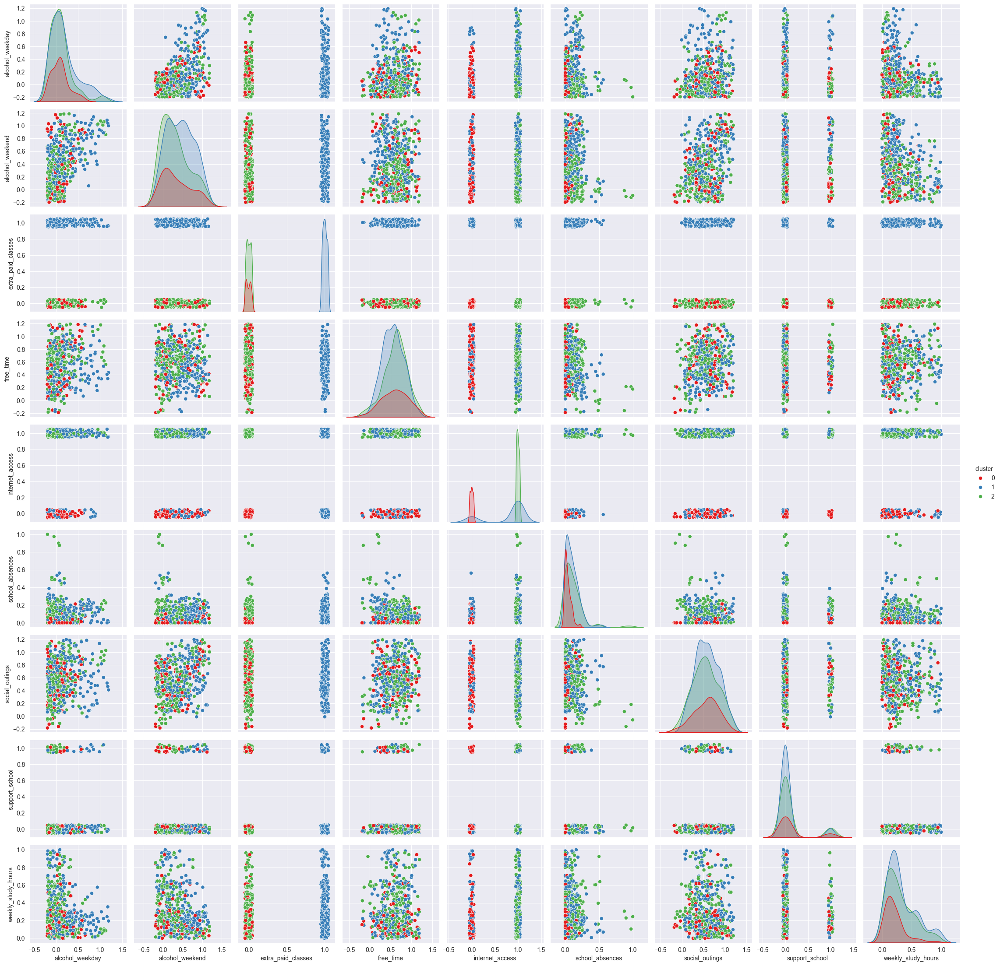

In [28]:
pairplot(df1_jitter, labels_kmeans_1)

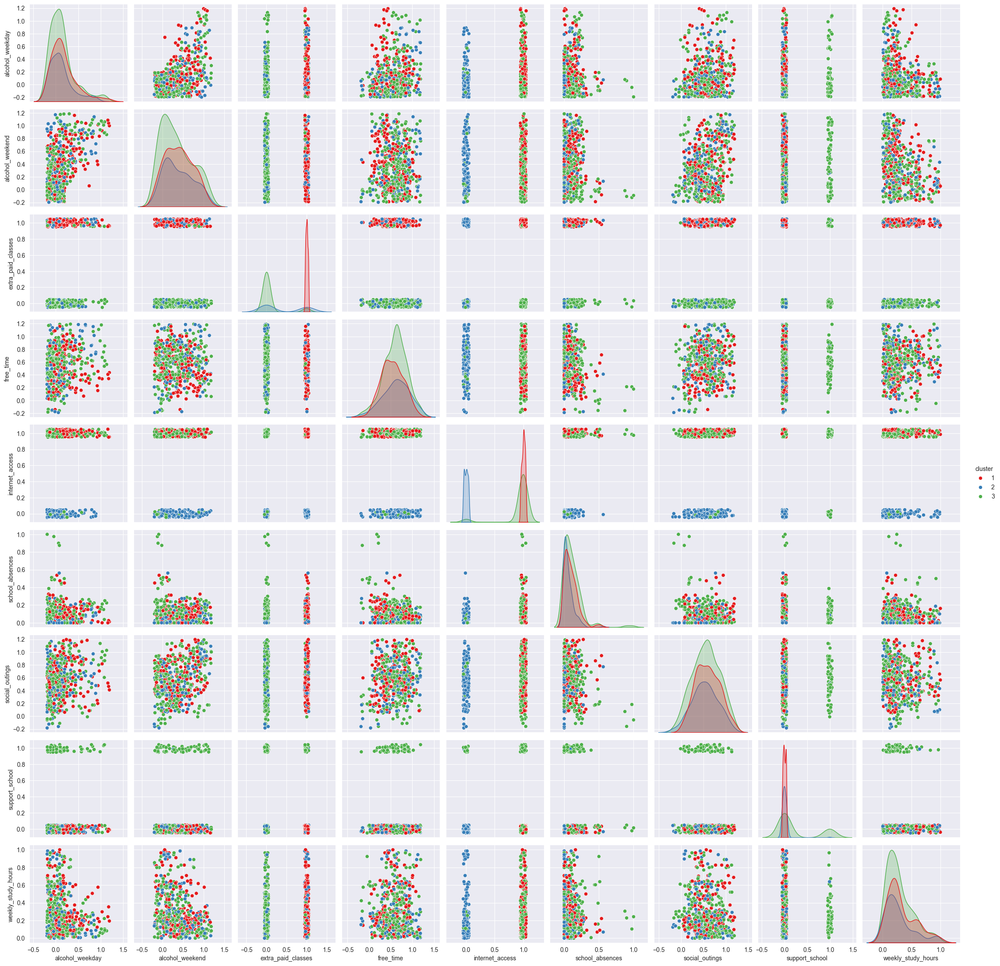

In [29]:
pairplot(df1_jitter, labels_hc_1)

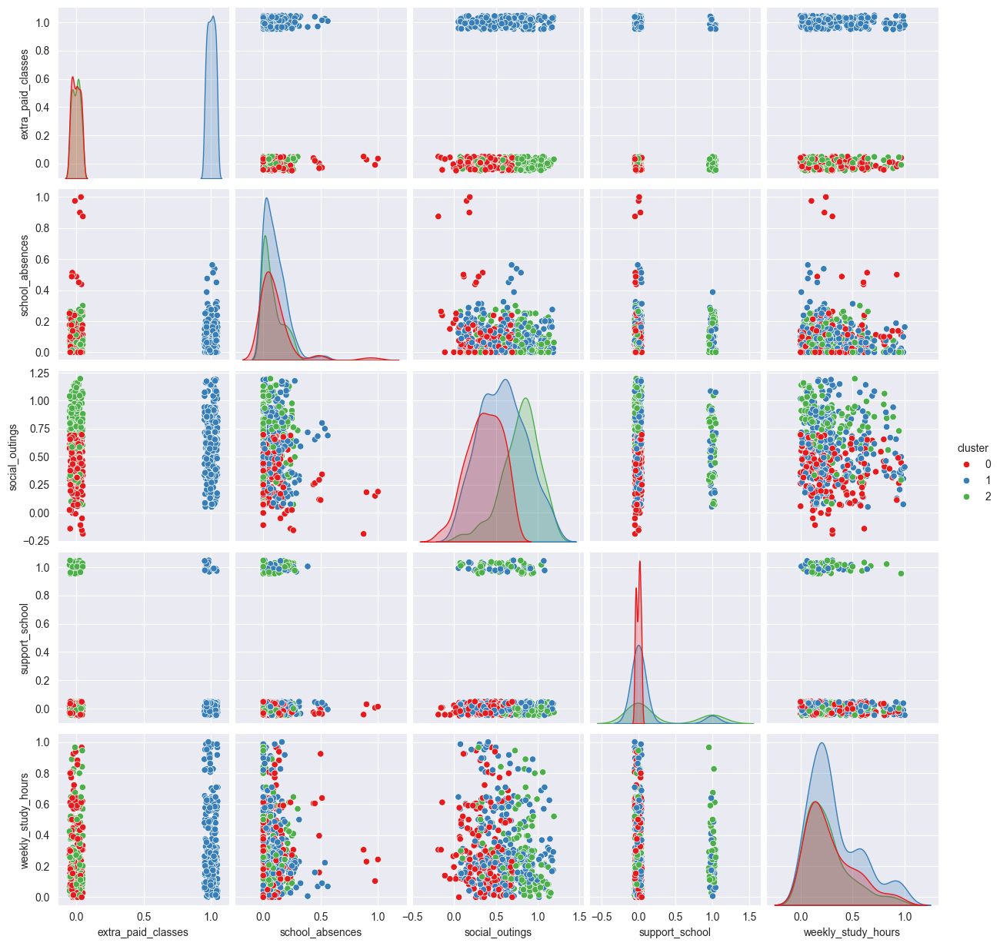

In [30]:
pairplot(df2_jitter, labels_kmeans_2)

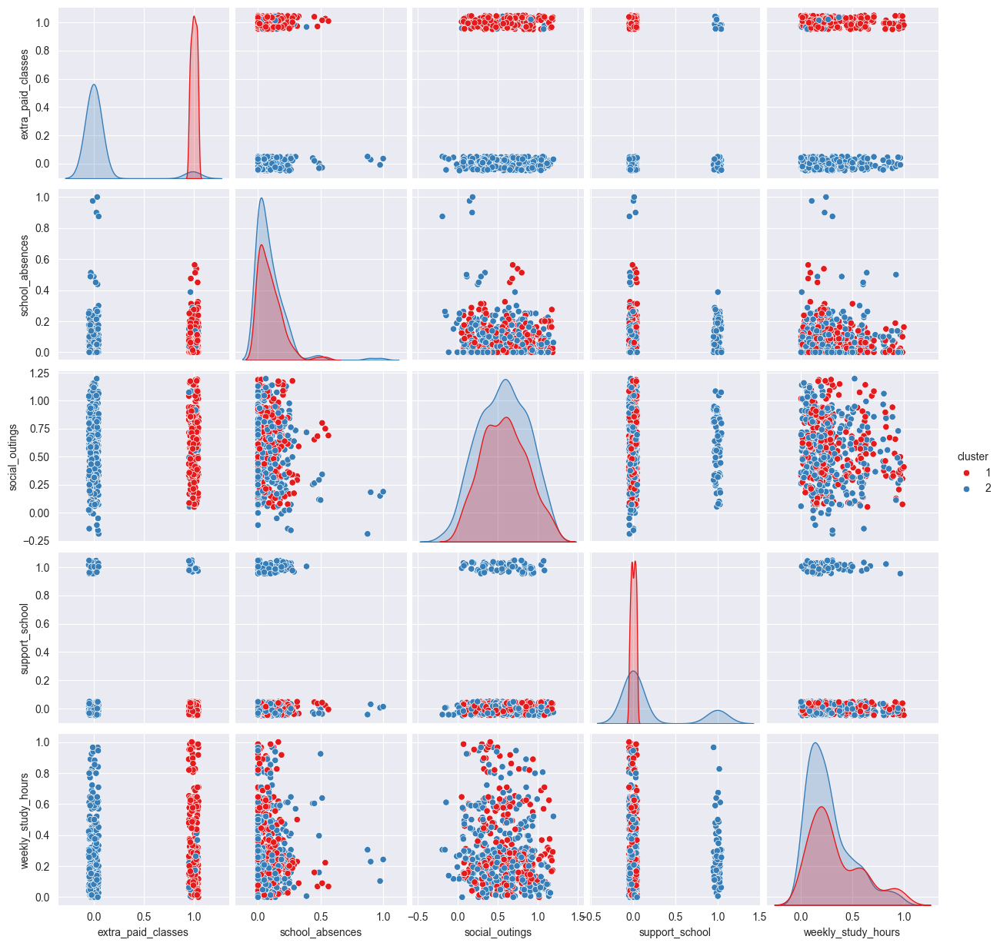

In [31]:
pairplot(df2_jitter, labels_hc_2)

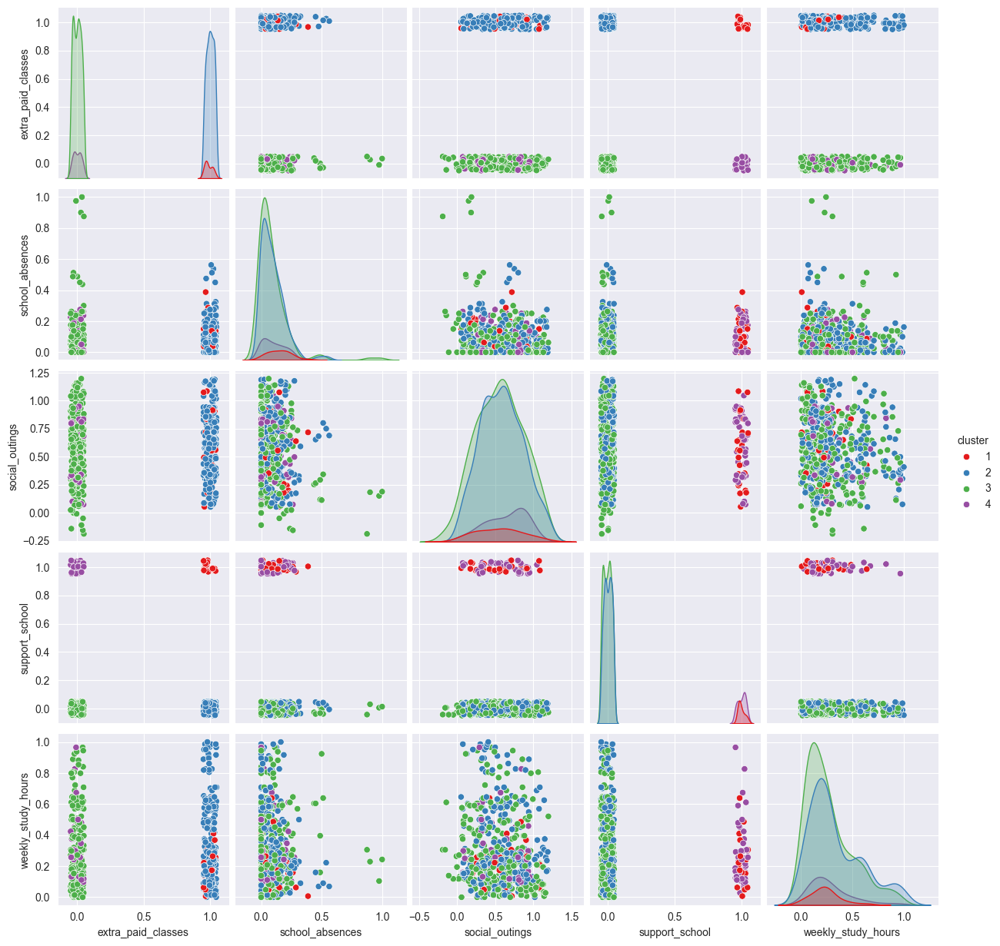

In [32]:
pairplot(df2_jitter, labels_hc_3)

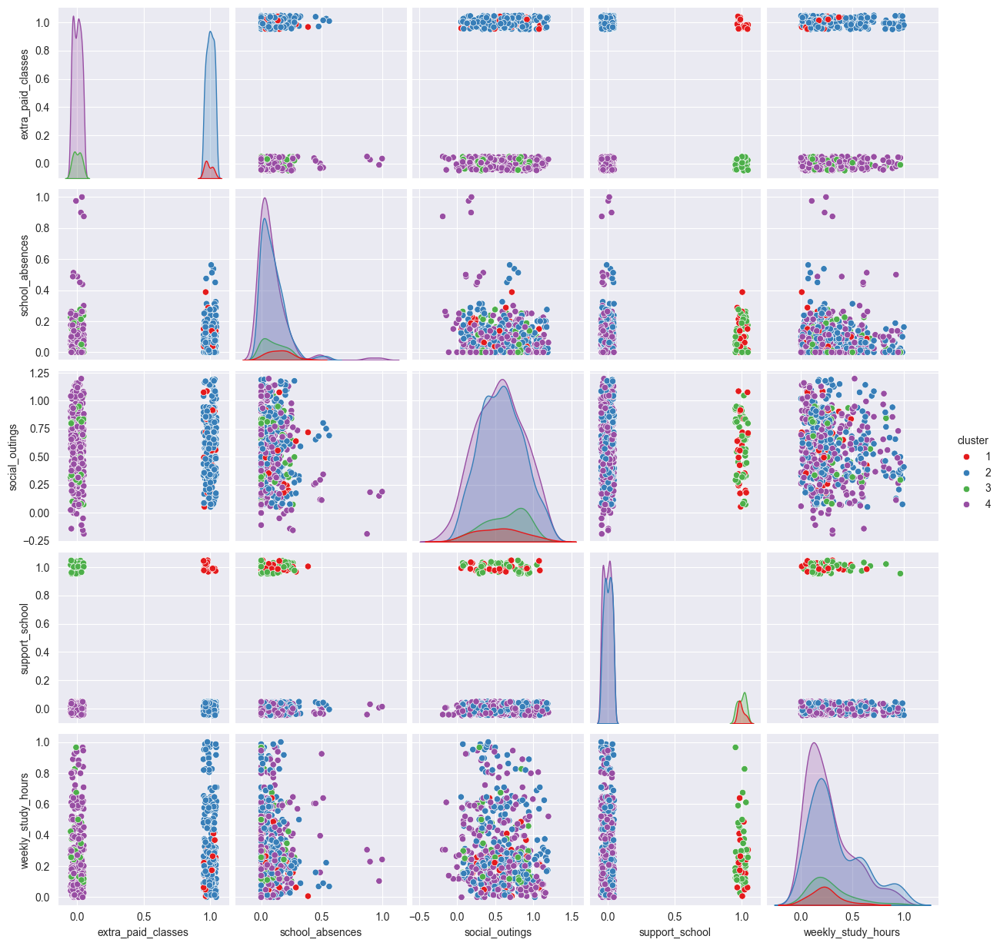

In [33]:
pairplot(df2_jitter, labels_hc_4)

In [34]:
def boxplot_doelvar(label, df, title):
    df = df.copy()
    df['Cluster'] = label
    titel = title
    # Selecteer relevante kolommen en zet ze in long-form
    features = ['grade_final', 'grade_period1', 'grade_period2']
    df_melted = df.melt(id_vars='Cluster', value_vars=features, var_name='Feature', value_name='Score')
    
    # Plot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Feature', y='Score', hue='Cluster', data=df_melted, palette='Set1')
    plt.title(titel)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

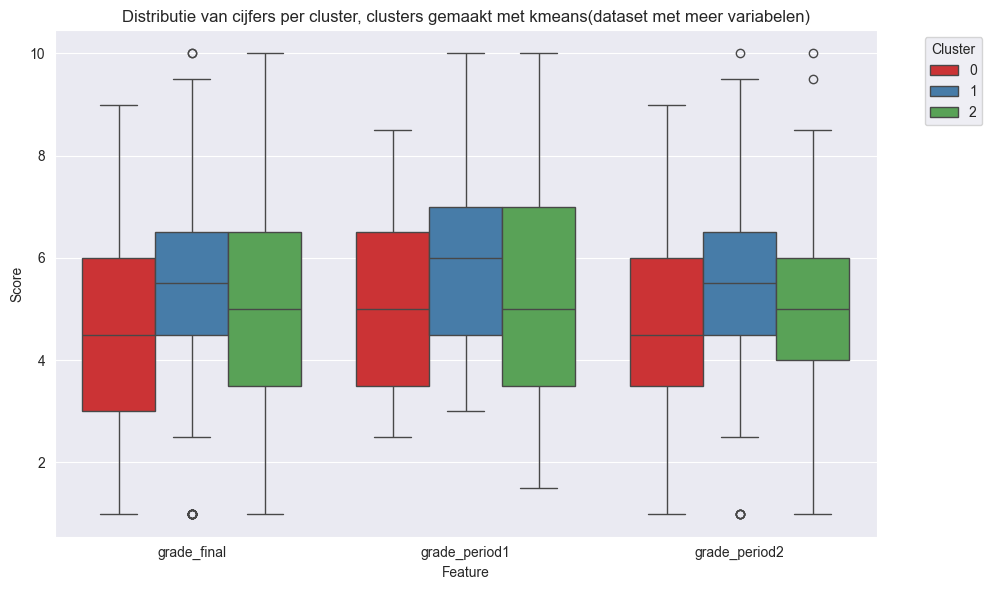

In [35]:
boxplot_doelvar(labels_kmeans_1, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met kmeans(dataset met meer variabelen)")

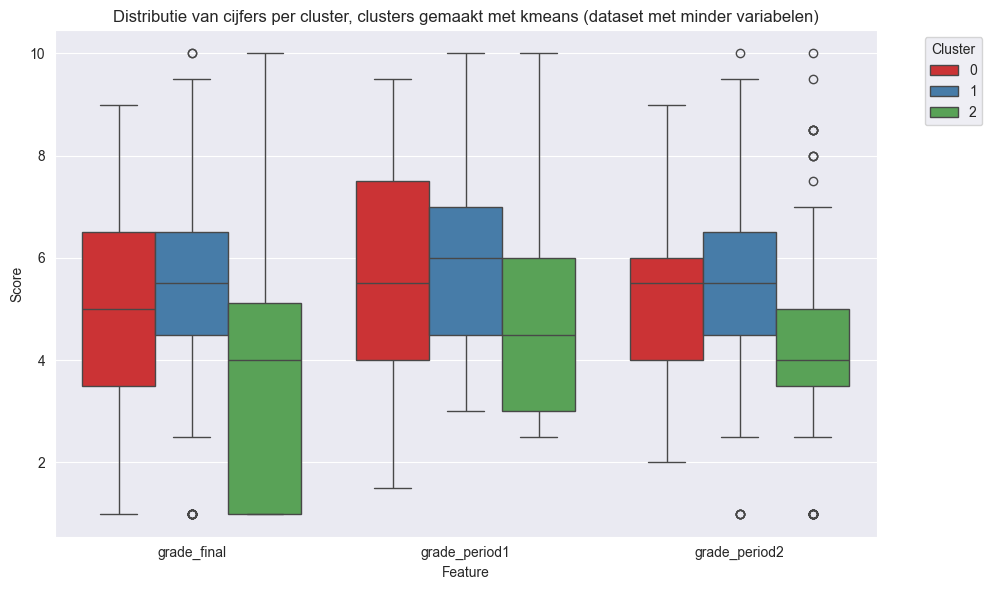

In [36]:
boxplot_doelvar(labels_kmeans_2, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met kmeans (dataset met minder variabelen)")

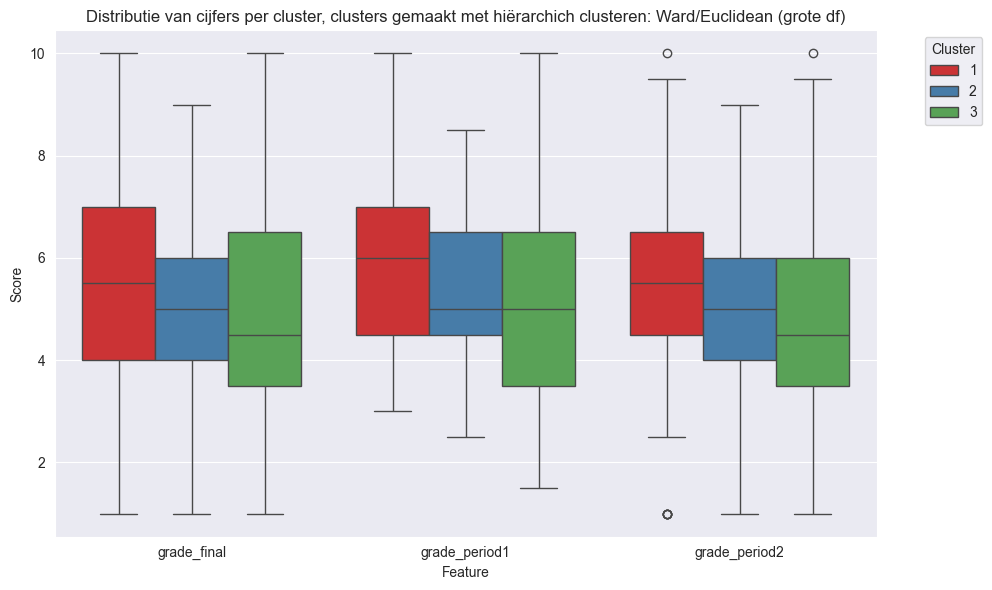

In [37]:
boxplot_doelvar(labels_hc_1, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met hiërarchich clusteren: Ward/Euclidean (grote df)")

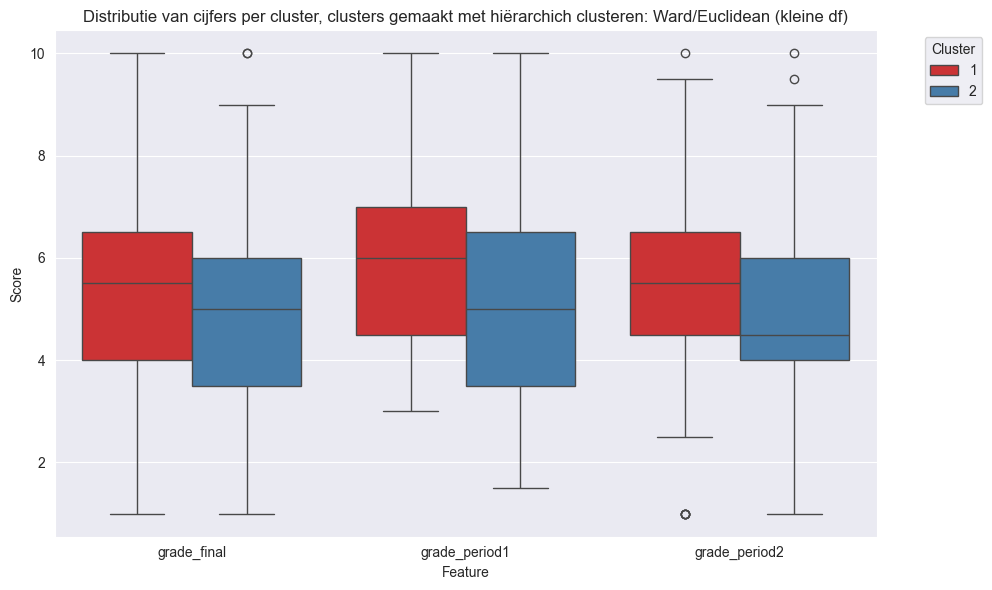

In [38]:
boxplot_doelvar(labels_hc_2, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met hiërarchich clusteren: Ward/Euclidean (kleine df)")

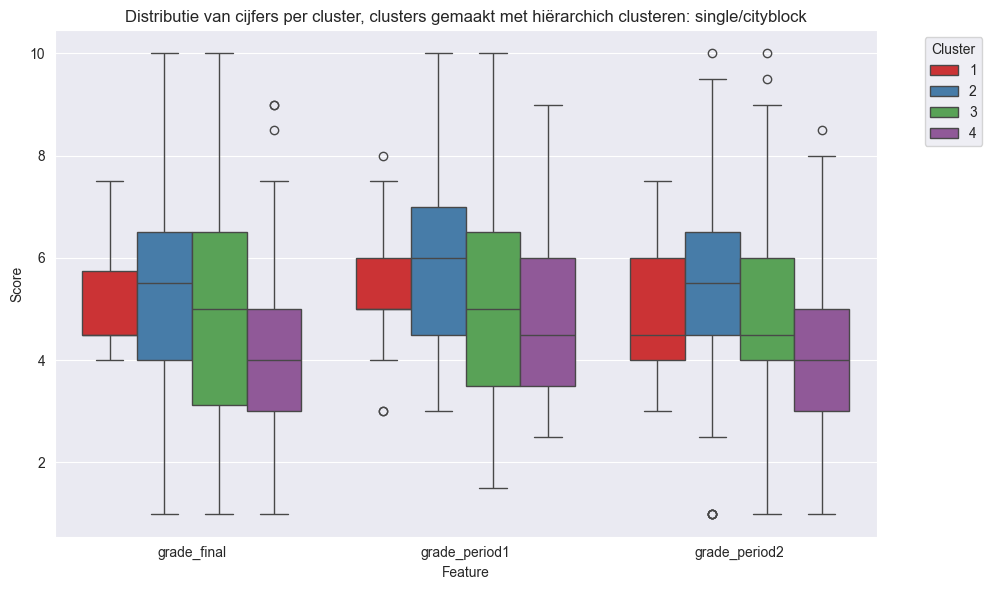

In [39]:
boxplot_doelvar(labels_hc_3, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met hiërarchich clusteren: single/cityblock")

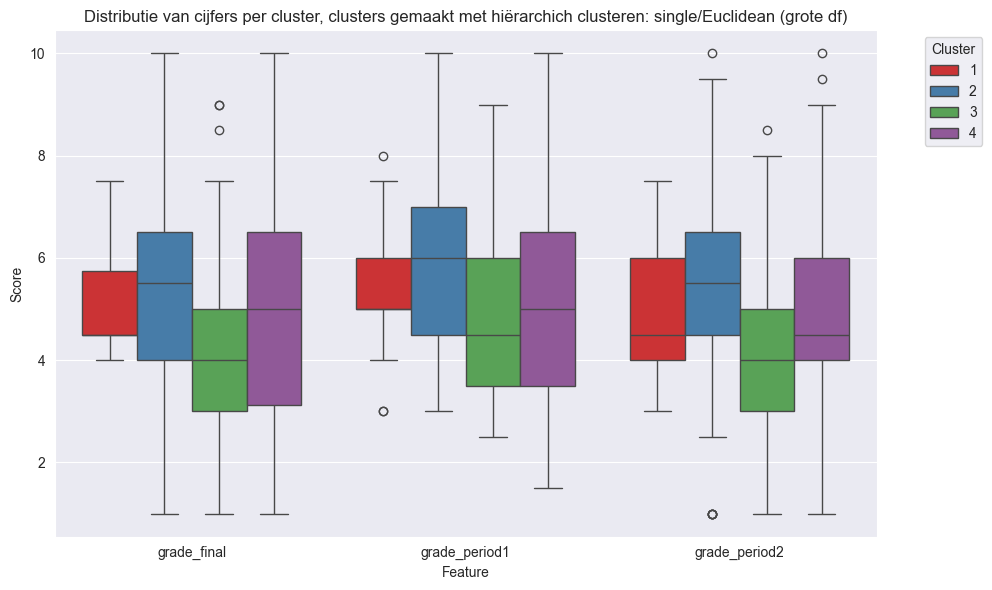

In [40]:
boxplot_doelvar(labels_hc_4, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met hiërarchich clusteren: single/Euclidean (grote df)")

# Density based metrics

Bij deze testen wordt wel een jitter gebruikt omdat uit eerdere testen bleek dat density based het niet goed leek te doen met categorsiche variabelen

In [41]:
scaler2 = MinMaxScaler()
scaler2.fit(df1_jitter) # dit hebben we later nodig
df1_jitter_scaled = scaler.fit_transform(df1_jitter)

In [42]:
def objective(trial):
    n_components = trial.suggest_int("n_components", 1, 10)
    covariance_type = trial.suggest_categorical("covariance_type", ["full", "diag", "tied", "spherical"])
    reg_covar = trial.suggest_float("reg_covar", 1e-6, 1e-2, log=True)

    gmm_model = GaussianMixture(n_components=n_components, covariance_type=covariance_type, reg_covar=reg_covar)
    gmm_model.fit(df1_jitter_scaled)
    return gmm_model.bic(df1_jitter_scaled)

# maak Optuna-study met deze procedure aan
study = optuna.create_study(direction="minimize")

# voer Optuna grid search uit
optuna.logging.disable_default_handler() # optioneel: voorkom output per study
study.optimize(objective, n_trials=1000)

[I 2025-10-05 19:14:48,341] A new study created in memory with name: no-name-bcf490c1-daaf-4787-9506-18a5d22da998


In [43]:
# bekijk optimalisatieproces
optuna.visualization.plot_optimization_history(study)

In [44]:
optuna.visualization.plot_slice(study)

In [45]:
best_params = study.best_params
best_params

{'n_components': 10,
 'covariance_type': 'tied',
 'reg_covar': 3.0750560844431074e-06}

In [46]:
def bootstrap_gmm_stability(X, scaler=None, n_bootstraps=100, gmm_params=None):
    n_components = gmm_params.get("n_components", 10)
    covariance_type = gmm_params.get("covariance_type", "tied")
    reg_covar = gmm_params.get("reg_covar", 1e-6)

    all_weights = []

    for i in range(n_bootstraps):
        X_resampled = resample(X, replace=True, random_state=i)

        if scaler is not None:
            X_resampled = scaler().fit_transform(X_resampled)

        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, reg_covar=reg_covar)

        gmm.fit(X_resampled)
        all_weights.append(gmm.weights_)

    return np.array(all_weights)

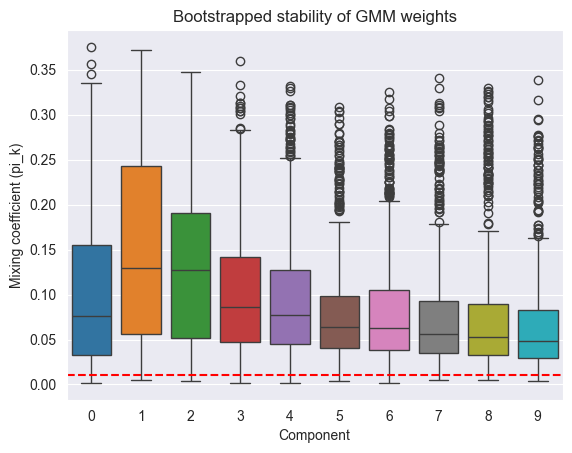

In [47]:
weights_matrix = bootstrap_gmm_stability(df1_jitter_scaled, scaler=MinMaxScaler, n_bootstraps=500, gmm_params=best_params)

# visualiseer gewichten
sns.boxplot(data=weights_matrix)
plt.xlabel("Component")
plt.ylabel("Mixing coefficient (pi_k)")
plt.title("Bootstrapped stability of GMM weights")
plt.axhline(0.01, linestyle = 'dashed', color = 'red')
plt.show()

In [48]:
best_gmm = GaussianMixture(n_components=10, covariance_type=best_params['covariance_type'], reg_covar=best_params['reg_covar'])
best_gmm.fit(df1_jitter_scaled)

,n_components,10
,covariance_type,'tied'
,tol,0.001
,reg_covar,3.0750560844431074e-06
,max_iter,100
,n_init,1
,init_params,'kmeans'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,None


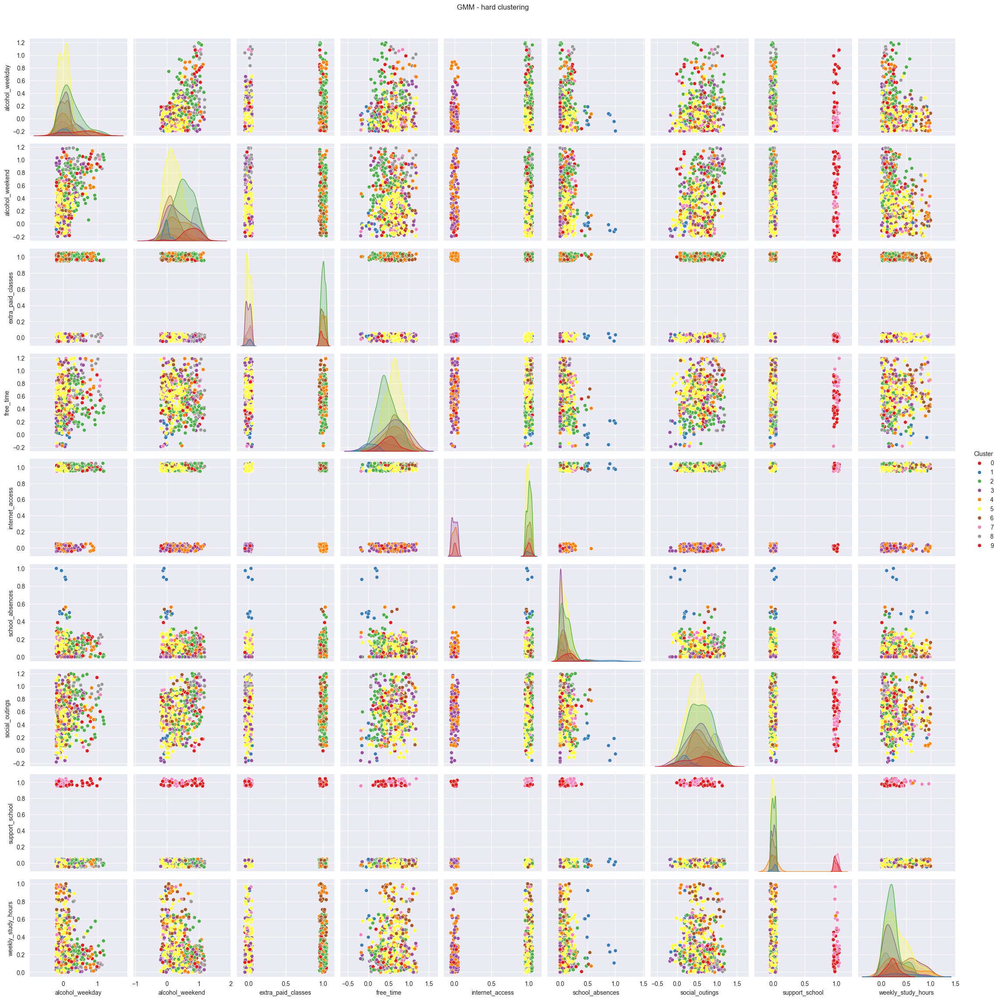

In [49]:
# pas hard clustering toe op basis van GMM
labels_GMM_df1 = best_gmm.predict(df1_jitter_scaled)

# voeg clusterlabels toe aan de data
input_data = df1_jitter.copy()
input_data.loc[:,'Cluster'] = labels_GMM_df1

# pairplot
sns.pairplot(
    data=input_data,
    vars=['alcohol_weekday', 'alcohol_weekend', 'extra_paid_classes', 'free_time', 'internet_access',
       'school_absences', 'social_outings', 'support_school', 'weekly_study_hours'],
    hue='Cluster',
    palette="Set1",
    diag_kind="kde",
)
plt.suptitle("GMM - hard clustering", y=1.02)
plt.show()

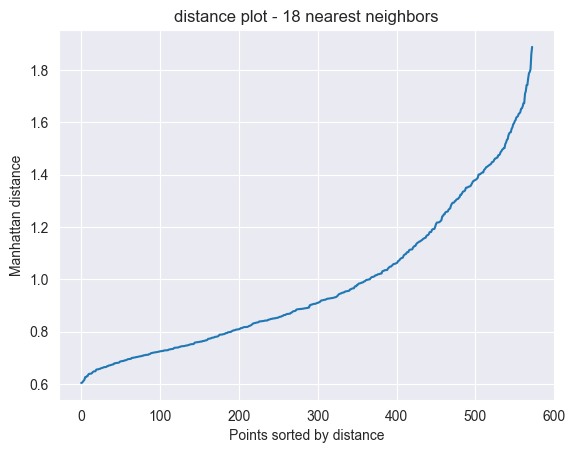

In [52]:
k = 2 * df1_jitter_scaled.shape[1]
#k = 6
neighbors = NearestNeighbors(n_neighbors=k, metric='manhattan')
neighbors_fit = neighbors.fit(df1_jitter_scaled)
distances, indices = neighbors_fit.kneighbors(df1_jitter_scaled)

# maak distance plot
distances = np.sort(distances[:, k-1])
plt.plot(distances)
plt.title(f"distance plot - {k} nearest neighbors")
plt.xlabel("Points sorted by distance")
plt.ylabel("Manhattan distance")
plt.grid(True)
plt.show()

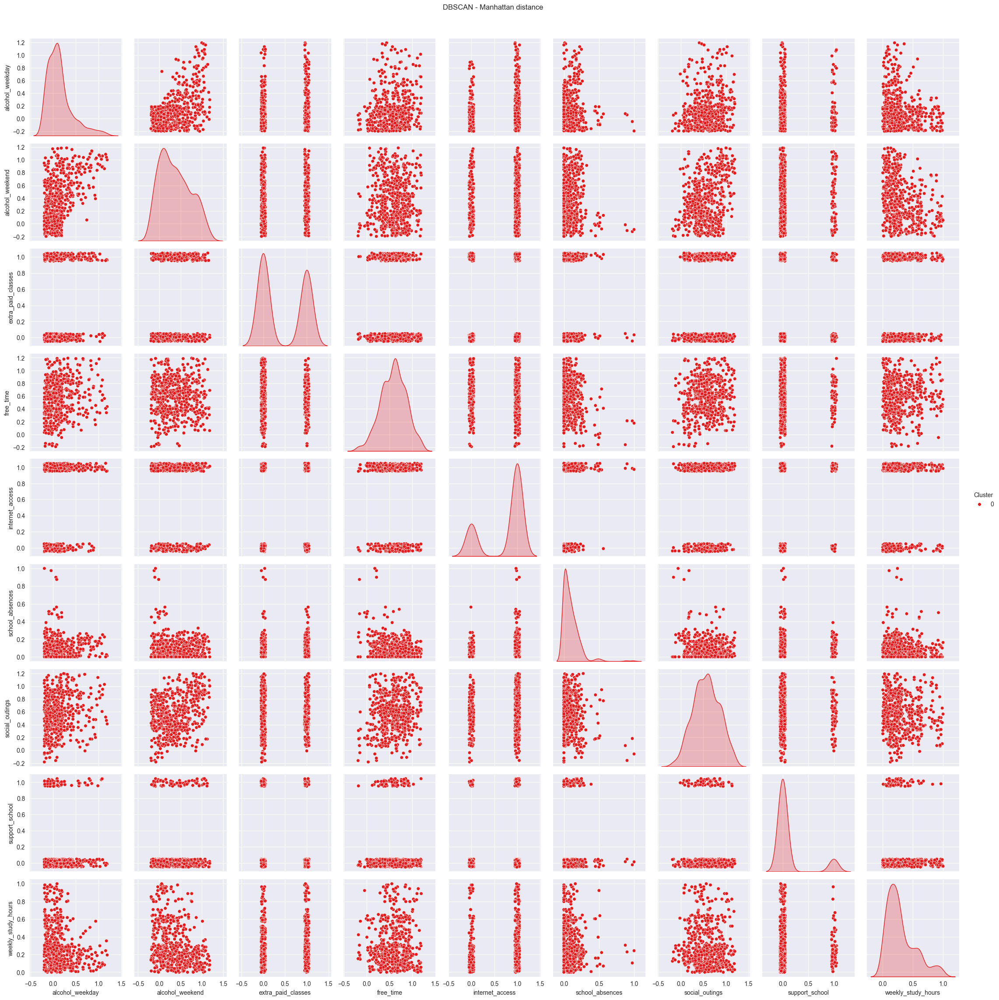

In [53]:
dbscan = DBSCAN(eps=1.6, min_samples=k, metric='manhattan')
dbscan_fit = dbscan.fit(df1_jitter_scaled)

# haal de clusterlabels en classificaties van punten op
labels_DBSCAN_df1 = dbscan_fit.labels_

# plot clustering in pairplot
input_data = df1_jitter.copy()
input_data.loc[:,'Cluster'] = labels_DBSCAN_df1

sns.pairplot(input_data, hue="Cluster", palette="Set1", diag_kind="kde", plot_kws={"s": 30})
plt.suptitle("DBSCAN - Manhattan distance", y=1.02)
plt.show()

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



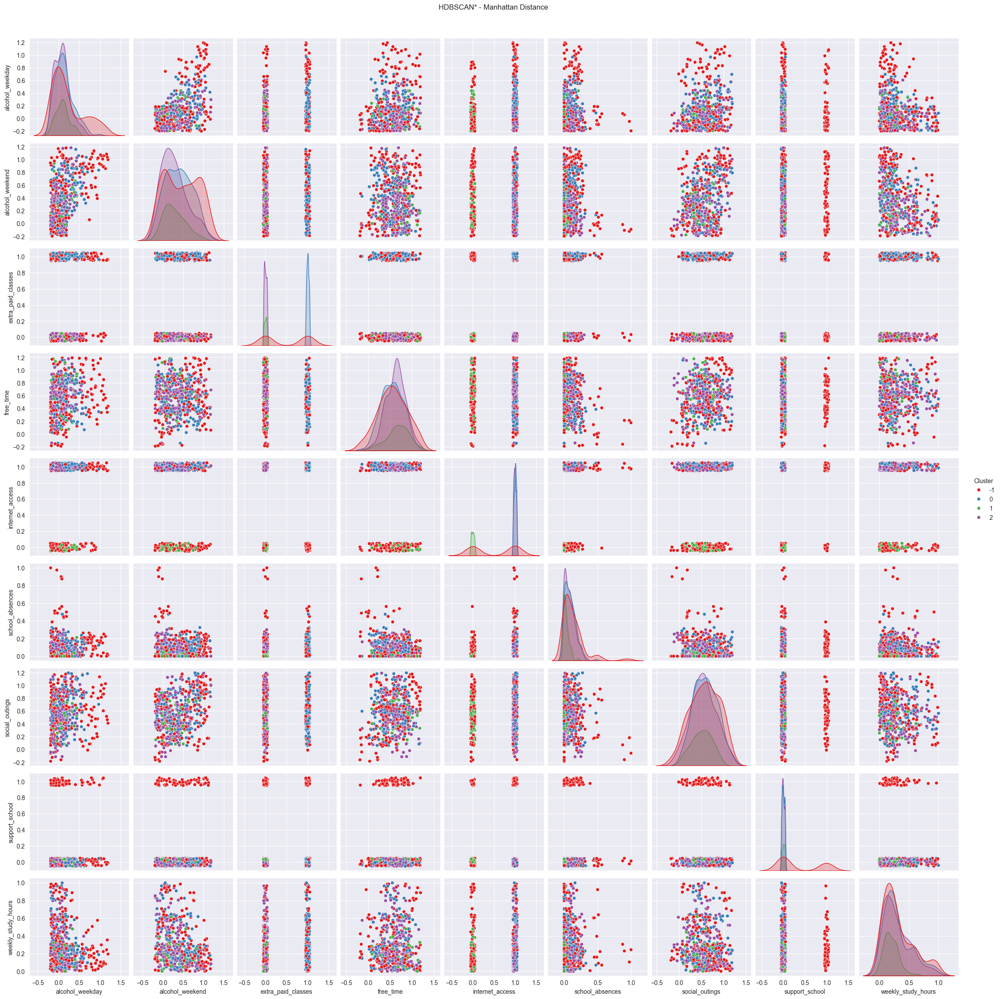

In [54]:
clusterer = hdbscan.HDBSCAN(min_cluster_size = 2*9, metric = 'manhattan')
labels_HDBSCAN_df1 = clusterer.fit_predict(df1_jitter_scaled)

# plot clustering in pairplot
input_data = input_data.copy()
input_data.loc[:,'Cluster'] = labels_HDBSCAN_df1

sns.pairplot(input_data, hue="Cluster", palette="Set1", diag_kind="kde", plot_kws={"s": 30})
plt.suptitle("HDBSCAN* - Manhattan Distance", y=1.02)
plt.show()

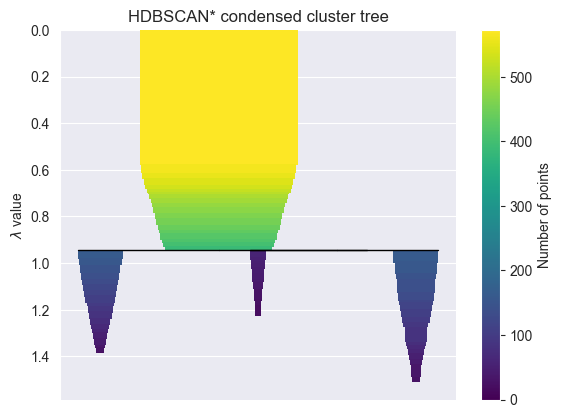

In [55]:
# plot condensed cluster tree
clusterer.condensed_tree_.plot()
plt.title("HDBSCAN* condensed cluster tree")
plt.show()

Nu werken met alleen de numerieke variabelen

In [56]:
df_2var = df.drop(columns=bin_var1)
df_2var = df_2var.drop(columns=ord_var1)
df_2var.columns
scaler3 = MinMaxScaler()
scaler3.fit(df_2var) # dit hebben we later nodig
df_2var_scaled = scaler3.fit_transform(df_2var)

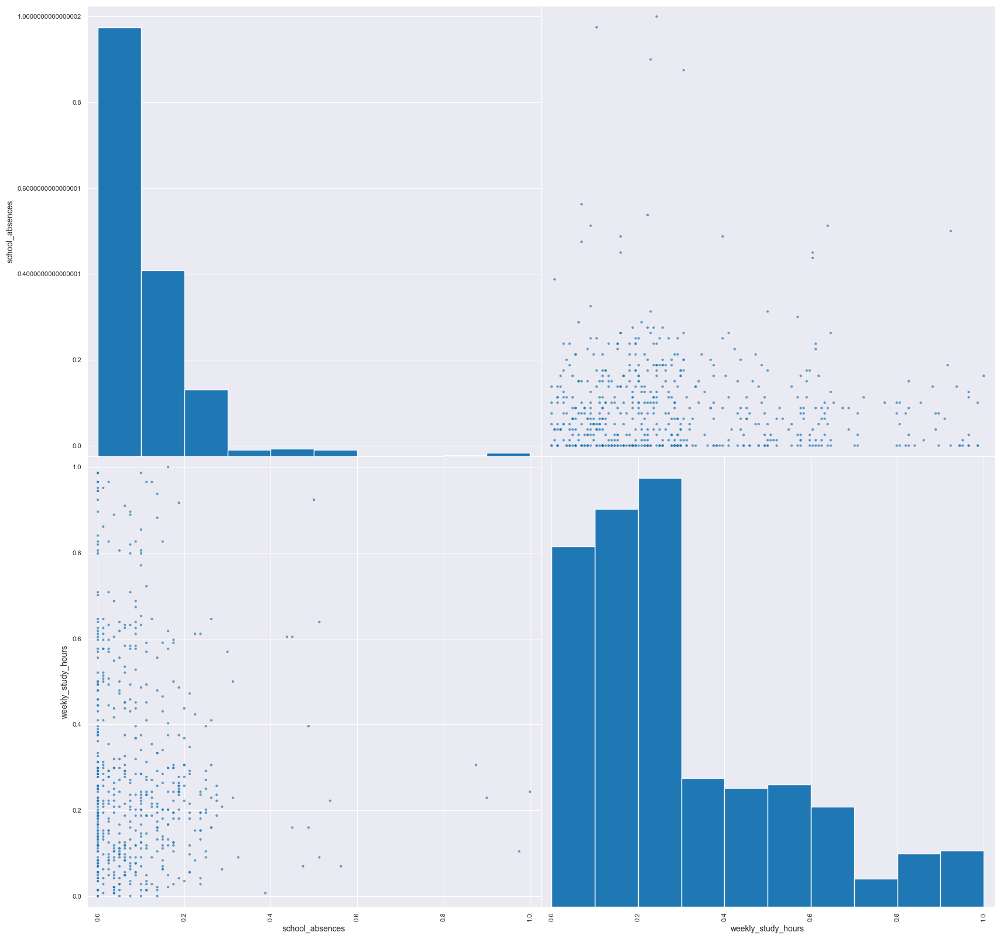

In [57]:
scatter_matrix(df_2var, figsize=(20, 20), diagonal="hist", alpha=0.7)
plt.show()

In [58]:
def objective2(trial):
    n_components = trial.suggest_int("n_components", 1, 10)
    covariance_type = trial.suggest_categorical("covariance_type", ["full", "diag", "tied", "spherical"])
    reg_covar = trial.suggest_float("reg_covar", 1e-6, 1e-2, log=True)

    gmm_model = GaussianMixture(n_components=n_components, covariance_type=covariance_type, reg_covar=reg_covar)
    gmm_model.fit(df_2var_scaled)
    return gmm_model.bic(df_2var_scaled)

# maak Optuna-study met deze procedure aan
study2 = optuna.create_study(direction="minimize")

# voer Optuna grid search uit
optuna.logging.disable_default_handler() # optioneel: voorkom output per study
study2.optimize(objective2, n_trials=1000)

In [59]:
# bekijk optimalisatieproces
optuna.visualization.plot_optimization_history(study2)

In [60]:
optuna.visualization.plot_slice(study2)

In [61]:
best_params2 = study2.best_params
best_params2

{'n_components': 5,
 'covariance_type': 'diag',
 'reg_covar': 1.001271128913554e-06}

In [62]:
def bootstrap_gmm_stability2(X, scaler=None, n_bootstraps=100, gmm_params=None):
    n_components = gmm_params.get("n_components", 6)
    covariance_type = gmm_params.get("covariance_type", "diag")
    reg_covar = gmm_params.get("reg_covar", 1e-6)

    all_weights = []

    for i in range(n_bootstraps):
        X_resampled = resample(X, replace=True, random_state=i)

        if scaler is not None:
            X_resampled = scaler().fit_transform(X_resampled)

        gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, reg_covar=reg_covar)

        gmm.fit(X_resampled)
        all_weights.append(gmm.weights_)

    return np.array(all_weights)

In [63]:
weights_matrix2 = bootstrap_gmm_stability(df_2var_scaled, scaler=MinMaxScaler, n_bootstraps=500, gmm_params=best_params2)

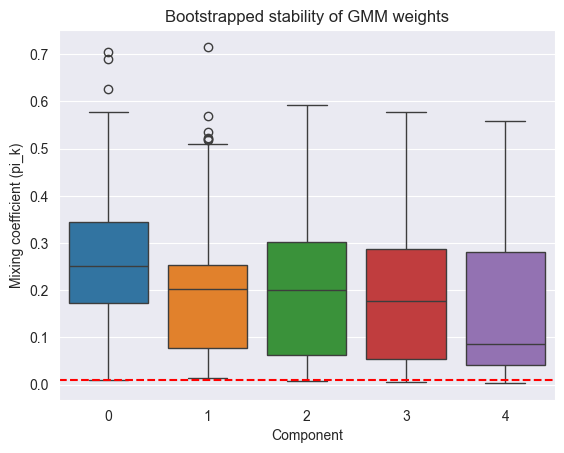

In [64]:
# visualiseer gewichten
sns.boxplot(data=weights_matrix2)
plt.xlabel("Component")
plt.ylabel("Mixing coefficient (pi_k)")
plt.title("Bootstrapped stability of GMM weights")
plt.axhline(0.01, linestyle = 'dashed', color = 'red')
plt.show()


In [65]:
best_gmm2 = GaussianMixture(n_components=6, covariance_type=best_params2['covariance_type'], reg_covar=best_params2['reg_covar'])
best_gmm2.fit(df_2var_scaled)

,n_components,6
,covariance_type,'diag'
,tol,0.001
,reg_covar,1.001271128913554e-06
,max_iter,100
,n_init,1
,init_params,'kmeans'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,None


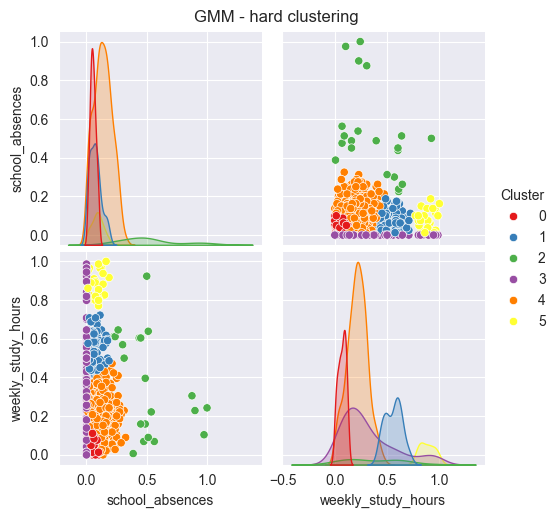

In [66]:
# pas hard clustering toe op basis van GMM
labels_GMM_2var = best_gmm2.predict(df_2var_scaled)

# voeg clusterlabels toe aan de data
input_data = df_2var.copy()
input_data.loc[:,'Cluster'] = labels_GMM_2var

# pairplot
sns.pairplot(
    data=input_data,
    vars=['school_absences','weekly_study_hours'],
    hue='Cluster',
    palette="Set1",
    diag_kind="kde",
)
plt.suptitle("GMM - hard clustering", y=1.02)
plt.show()


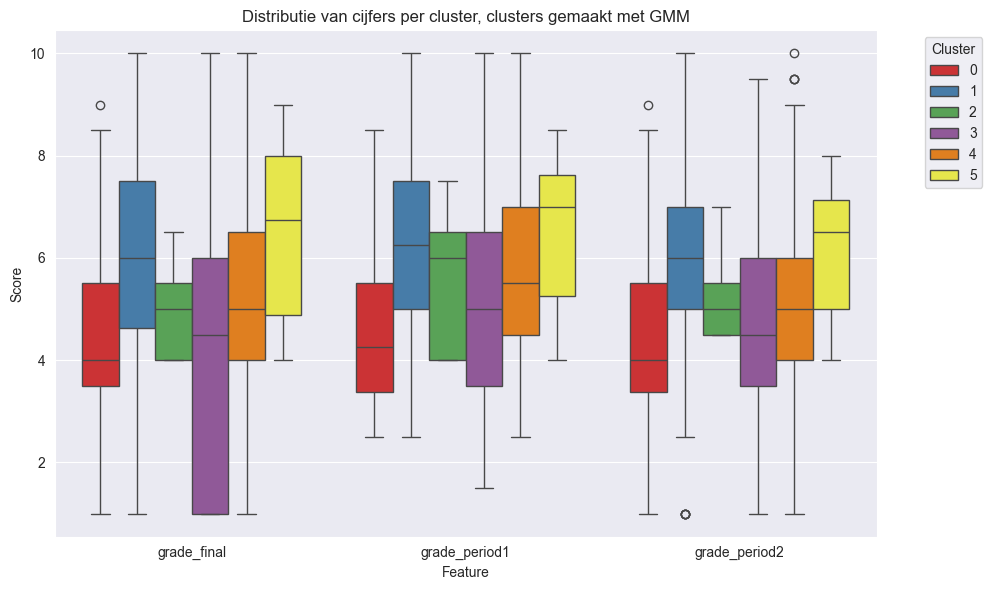

In [67]:
boxplot_doelvar(labels_GMM_2var, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met GMM")

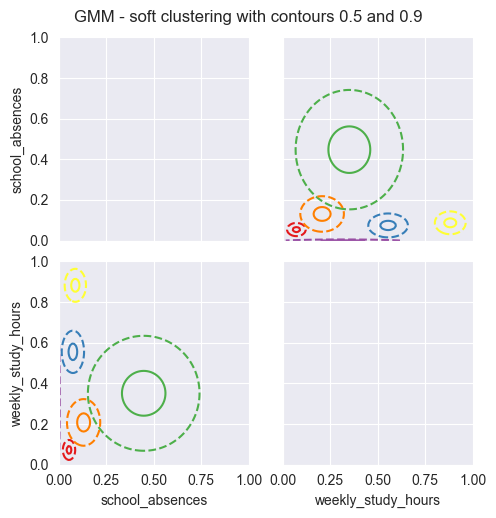

In [68]:
# Bouw de pairplotmatrix voor soft clustering
features = ['school_absences', 'weekly_study_hours']
g = sns.PairGrid(df_2var, vars=features)

# Transformeer de GMM-parameters terug naar de originele schaal (MinMaxScaler)
means_original = scaler3.inverse_transform(best_gmm2.means_)
scale = scaler3.data_range_  # Correct voor MinMaxScaler

covariances_original = []
for diag_var in best_gmm2.covariances_:
    if diag_var.ndim == 1:
        # diag_var bevat varianties per feature in geschaalde ruimte
        original_variances = diag_var * (scale ** 2)
        cov_matrix = np.diag(original_variances)
    else:
        # voor 'full' covariance_type
        cov_matrix = diag_var * scale[:, None] * scale[None, :]

    # Forceer symmetrie en positieve semidefinitie
    cov_matrix = (cov_matrix + cov_matrix.T) / 2
    eigvals = np.linalg.eigvalsh(cov_matrix)
    if np.any(eigvals <= 0):
        cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-6  # regularisatie

    covariances_original.append(cov_matrix)

# Functie voor plotten van GMM-contouren (soft clustering)
def plot_gmm_contours(x, y, levels=[0.5, 0.9], **kwargs):
    ax = plt.gca()
    palette = sns.color_palette("Set1", best_gmm2.n_components)

    # Plot niets op de diagonaal
    if x.name == y.name:
        return

    xi = features.index(x.name)
    yi = features.index(y.name)

    for i in range(best_gmm2.n_components):
        mean = means_original[i][[xi, yi]]
        cov = covariances_original[i][np.ix_([xi, yi], [xi, yi])]

        # Check op geldige covariantiematrix
        cov = (cov + cov.T) / 2
        eigvals = np.linalg.eigvalsh(cov)
        if np.any(eigvals <= 0):
            continue  # sla component over als matrix ongeldig is

        # Maak het grid
        x_range = df_2var[x.name]
        y_range = df_2var[y.name]
        xx, yy = np.meshgrid(
            np.linspace(x_range.min(), x_range.max(), 100),
            np.linspace(y_range.min(), y_range.max(), 100)
        )
        pos = np.dstack((xx, yy))
        rv = multivariate_normal(mean, cov)
        z = rv.pdf(pos)

        # Normaliseer
        z /= z.max()

        # Plot gewenste contouren
        for level in levels:
            linestyle = 'dashed' if level < 0.7 else 'solid'
            ax.contour(xx, yy, z, levels=[level], colors=[palette[i]], linestyles=linestyle)

# Maak de plot
g.map(plot_gmm_contours, levels=[0.5, 0.9])
g.map_diag(lambda *args, **kwargs: None)
plt.suptitle("GMM - soft clustering with contours 0.5 and 0.9", y=1.02)

# Geef de plot weer
plt.show()

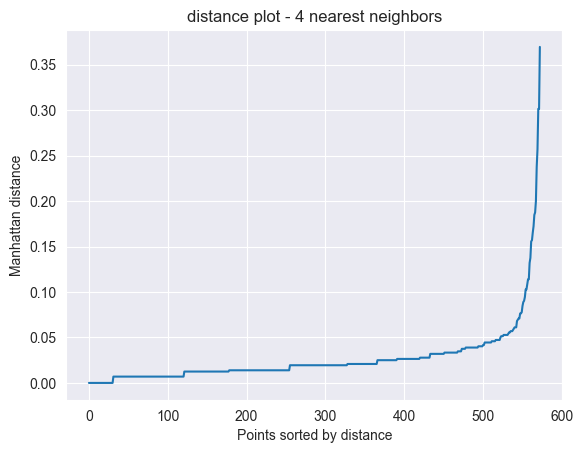

In [69]:
k2 = 2 * df_2var_scaled.shape[1]
neighbors2 = NearestNeighbors(n_neighbors=k2, metric='manhattan')
neighbors2_fit = neighbors.fit(df_2var_scaled)
distances2, indices2 = neighbors2_fit.kneighbors(df_2var_scaled)

# maak distance plot
distances2 = np.sort(distances2[:, k2-1])
plt.plot(distances2)
plt.title(f"distance plot - {k2} nearest neighbors")
plt.xlabel("Points sorted by distance")
plt.ylabel("Manhattan distance")
plt.grid(True)
plt.show()

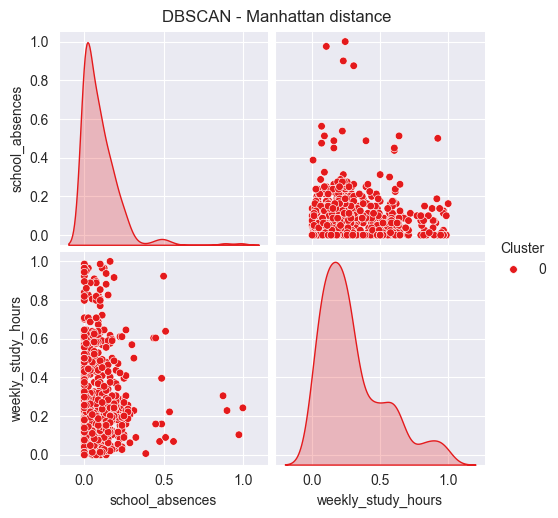

In [70]:
# voer DBSCAN uit
dbscan2 = DBSCAN(eps=0.05, min_samples=k, metric='manhattan')
dbscan2_fit = dbscan.fit(df_2var_scaled)

# haal de clusterlabels en classificaties van punten op
labels_DBSCAN_2var = dbscan2_fit.labels_

# plot clustering in pairplot
input_data = df_2var.copy()
input_data.loc[:,'Cluster'] = labels_DBSCAN_2var

sns.pairplot(input_data, hue="Cluster", palette="Set1", diag_kind="kde", plot_kws={"s": 30})
plt.suptitle("DBSCAN - Manhattan distance", y=1.02)
plt.show()

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

c:\Users\mitch\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



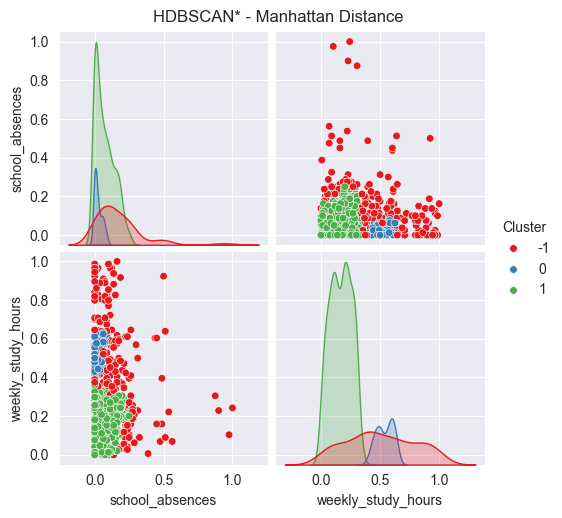

In [71]:
clusterer_2var = hdbscan.HDBSCAN(min_cluster_size = 2*7, metric = 'manhattan')
labels_HDBSCAN_2var = clusterer_2var.fit_predict(df_2var_scaled)

# plot clustering in pairplot
input_data = input_data.copy()
input_data.loc[:,'Cluster'] = labels_HDBSCAN_2var = clusterer_2var.fit_predict(df_2var_scaled)

sns.pairplot(input_data, hue="Cluster", palette="Set1", diag_kind="kde", plot_kws={"s": 30})
plt.suptitle("HDBSCAN* - Manhattan Distance", y=1.02)
plt.show()

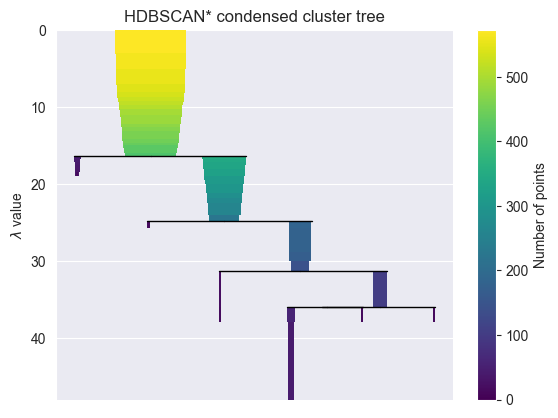

In [72]:
# plot condensed cluster tree
clusterer_2var.condensed_tree_.plot()
plt.title("HDBSCAN* condensed cluster tree")
plt.show()

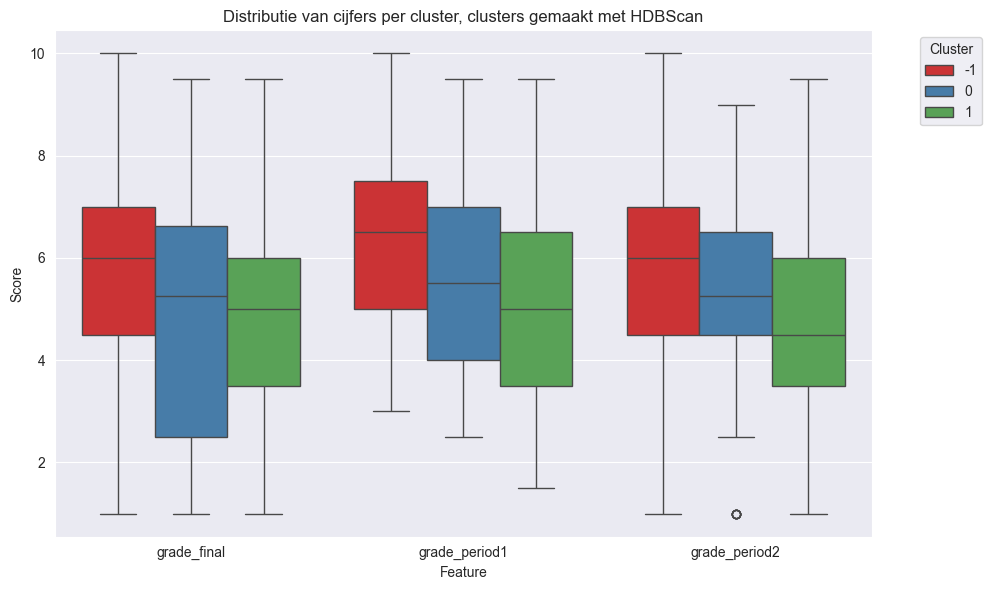

In [73]:
boxplot_doelvar(labels_HDBSCAN_2var, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met HDBScan")

Uit de clusters van de GMM, DBSCAM en HDBSCAN zijn niet echt duidelijke groepen te zien in de clusters, ook is de verdeling niet duidelijk als gekeken wordt naar de variabelen van de cijfers. Bij zowel de datasets met als zonder categorische variabelen. 

# Conclusie

De beste clustering voor dit probeem is gekomen van het Hiërarchisch clusteren met de ward linkage functie.

Voor het gemak nog even hier onder weergegeven

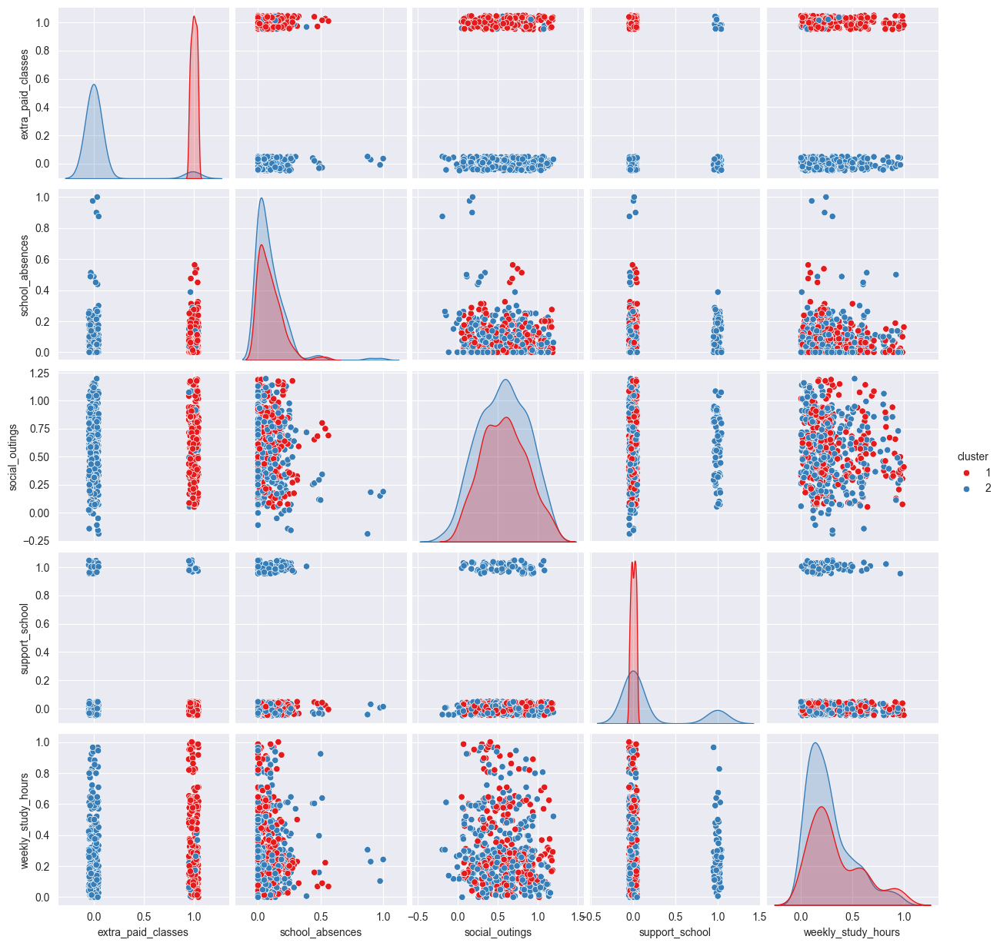

In [74]:
pairplot(df2_jitter, labels_hc_2)

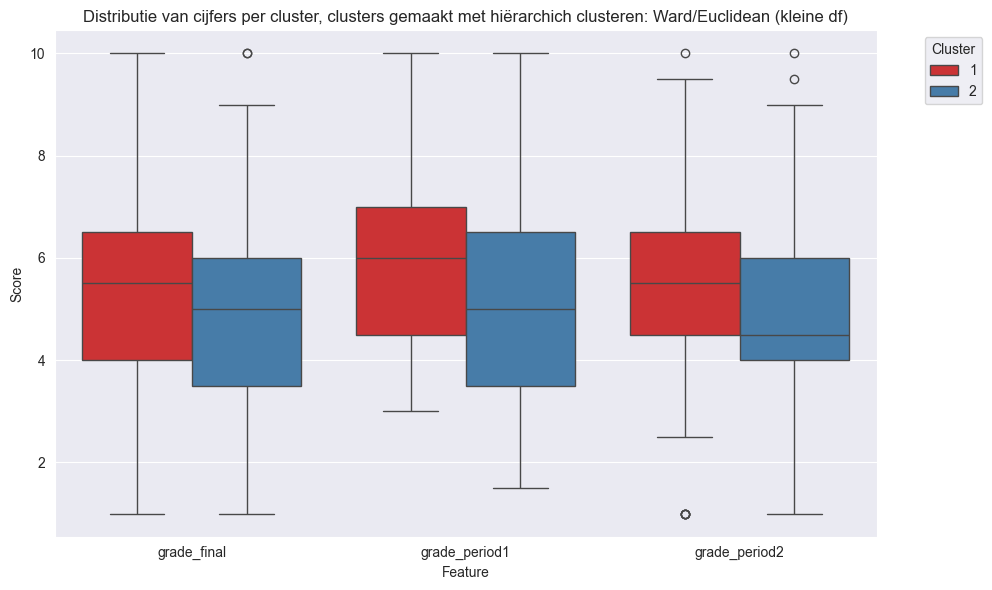

In [75]:
boxplot_doelvar(labels_hc_2, df_heel, "Distributie van cijfers per cluster, clusters gemaakt met hiërarchich clusteren: Ward/Euclidean (kleine df)")

Deze was gemaakt met de dataset waar nog alleen de variabelen inzaten waar de doelvariabele ook statistisch van leek af te hangen. 

Uit deze clustering lijken 2 groepen naar voren te komen:

Cluster 1: De studenten die betalen voor extra klassen, maar geen support van school hebben

Cluster 2: Studenten die niet betalen voor extra klassen

Het lijkt er op dat er wel een paar studenten in cluster 1 zitten die wel extra klassen betalen, maar dat is een vrij kleine groep, waardoor die worden gezien als uitbijter. 

Als wordt gekeken naar de clusters ten opzichte van de cijfers die behaald worden doet cluster 1 het ietsjes beter dan cluster 2. Het verschil is alleen niet heel groot.

Een advies aan de VAVO zou kunnen zijn om te kijken hoe ze de extra (betaalde) klassen toegankelijker kunnen maken, aangezien dit volgens dit onderzoek het meeste invloed heeft op het eindcijfer. Zo kunnen meer studenten hiervan profiteren en uiteindelijk een hoger cijfer krijgen. 

.

Zoals eerder benoemd was voor de uitbijters in cluster 2, lijkt deze clustering nog steeds niet op een super goede clustering, wel lijkt dit de beste clustering die wij er uit hebben kunnen halen.